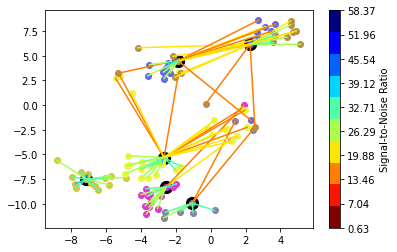

0.7289211750030518
{'Cluster Head': 'client43', 'Members': ['client6', 'client14', 'client15', 'client27', 'client33', 'client53', 'client54', 'client60', 'client61', 'client62', 'client75', 'client81', 'client83', 'client86', 'client98'], 'SNR': [12.579984840769534, 24.790607324961783, 16.22842526994185, 24.185043353285426, 14.628967340626586, 11.343936136030477, 15.063880288193204, 24.136297439435296, 12.281003396985719, 22.783324521812826, 9.655648125626485, 25.722217727743235, 16.038375913504954, 34.72685182990167, 28.243232064852343], 'CSI': [0.27149786988826885, 0.32323369041709726, 0.16582256606685497, 0.2152946050739023, 0.1445321449801833, 0.17594794188223006, 0.11263132122688002, 0.23059916729964347, 0.44320955647972216, 0.08966461268326664, 0.9153586998054275, 0.7069312871003495, 0.42266891895910896, 0.979162859428316, 0.9045737567444653]}


In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Dataset
import syft as sy
import numpy as np
from Dataset import load_dataset, getImage
from utils import averageModels
from utils import averageModelscluster
import random
import math
import matplotlib.pyplot as plt
from ipynb.fs.full.K_clusters import cluster_former
from copy import deepcopy

In [2]:
P=2 #signal power threshold
#stream = BitStream()
#random.seed(10)
key=[]
for i in range (10000): #generating a random password to activate training (Pilot signal)
    temp=random.randint(0,1)
    key.append(temp)

key1=[0]*len(key)
for i in range (len(key)):   #bpsk modulation
    if(key[i]==1):
        #print("yay")
        key1[i]=-math.sqrt(P)
    else:
        key1[i]=math.sqrt(P)

#print(key)
        
key_np=np.array(key1)

In [3]:
class Arguments():
    def __init__(self):
        self.images = 10000
        self.clients = 50
        self.rounds = 200
        self.epochs = 5
        self.local_batches = 64
        self.lr = 0.001
        self.C = 1 #fraction of clients used in the round
        self.drop_rate = 0 #fraction of devices in the selected set to be dropped for various reasons
        self.torch_seed = 0 #same weights and parameters whenever the program is run
        self.log_interval = 64
        self.iid = 'iid'
        self.split_size = int(self.images / self.clients)
        self.samples = self.split_size / self.images 
        self.use_cuda = False
        self.save_model = True
        self.numclusters=6

args = Arguments()

In [4]:
#checking if gpu is available
#use_cuda = args.use_cuda and torch.cuda.is_available()
use_cuda=False
device = torch.device("cuda:0" if use_cuda else "cpu")
kwargs = {'num_workers': 1, 'pin_memory': True} if use_cuda else {}

hook = sy.TorchHook(torch)
me = hook.local_worker
clients = []

#generating virtual clients
for i in range(args.clients):
    clients.append({'hook': sy.VirtualWorker(hook, id="client{}".format(i+1))})
#print(clients)

In [5]:
global_train, global_test, train_group, test_group = load_dataset(args.clients, args.iid) #load data

for inx, client in enumerate(clients):  #return actual image set for each client
    trainset_ind_list = list(train_group[inx]) 
    client['trainset'] = getImage(global_train, trainset_ind_list, args.local_batches)
    client['testset'] = getImage(global_test, list(test_group[inx]), args.local_batches)
    client['samples'] = len(trainset_ind_list) / args.images #useful while taking weighted average


In [6]:
#load dataset for global model (to compare accuracies)
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.1307,), (0.3081,))])
global_test_dataset = datasets.MNIST('./', train=False, download=True, transform=transform)
# global_test_dataset = torch.utils.data.random_split(global_test_dataset, [10000, len(global_test_dataset)-10000])[0]
global_test_loader = DataLoader(global_test_dataset, batch_size=args.local_batches, shuffle=True)

In [7]:
"""class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        #self.quant = torch.quantization.QuantStub()
        self.conv1 = nn.Conv2d(1, 5, 5, 1)
        self.conv2 = nn.Conv2d(5, 10, 5, 1)
        self.fc1 = nn.Linear(4*4*10, 50) #10 iid #50 non iid
        self.fc2 = nn.Linear(50, 10)

    def forward(self, x):
        #x=self.quant(x)
        x = F.relu(self.conv1(x))
        x = F.max_pool2d(x, 2, 2)
        x = F.relu(self.conv2(x))
        x = F.max_pool2d(x, 2, 2)
        x = x.view(-1, 4*4*10
                   )
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return F.log_softmax(x, dim=1) 
"""

class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(1, 10, kernel_size=5)
        self.conv2 = nn.Conv2d(10, 20, kernel_size=5)
        self.conv2_drop = nn.Dropout2d()
        self.fc1 = nn.Linear(320, 50)
        self.fc2 = nn.Linear(50, 10)

    def forward(self, x):
        x = F.relu(F.max_pool2d(self.conv1(x), 2))
        x = F.relu(F.max_pool2d(self.conv2_drop(self.conv2(x)), 2))
        x = x.view(-1, 320)
        x = F.relu(self.fc1(x))
        x = F.dropout(x, training=self.training)
        x = self.fc2(x)
        return F.log_softmax(x) 

In [8]:
def fedprox(params,global_params):
    global_param=[]
    ind=0
    for gp in global_params:
        global_param.append(gp)
    for p in params:
    #                 print(p.grad)
        lr=0.001
        mu=0.1
        if(p.grad is None):
            continue
        grad=p.grad.data #batch gradients
        p.data.sub_(lr,(grad+mu*(p.data.clone()-global_param[ind].data.clone())))
        ind+=1
    return(p)

In [9]:
def ClientUpdate(args, device, client,key_np,key,snr,csi,mu,head):
    gc=False
    client['model'].train()
    #simulating a wireless channel
    poptim=max((1/mu-1/csi),0)
    #print(mu,csi)
    print("Power Allocated=",poptim)
    print("CSI=",csi)
    
    snr__=10**(snr/10)
    
    absh=csi*poptim/snr__
    x=random.uniform(0,absh)
    #print(x)
    y=math.sqrt(absh*absh-x*x)
    #x=x*100
    #y=y*100
    #x=random.random()
    #y=random.random()
    #snr=10*math.log(poptim/(std*std),10)
    std=math.sqrt(poptim/snr__*absh*absh) #channel noise
    
    #print(x,y)
    h=complex(x,y)
    #std=math.sqrt(abs(h)/csi)
    #snr=poptim/(std*std)
    #print(std)
    print("SNR=",snr)
    #print("csi",abs(h)/(std*std))
    
    
    if(poptim!=0):
        data=client['model'].conv1.weight
        #data=data.cuda()
        data=data*math.sqrt(poptim) #transmitted signal
        #print(power)
        if(use_cuda):
            data=h*data+(torch.randn(data.size())*std).cuda() #channel affecting data
        else:
            data=h*data+(torch.randn(data.size())*std)
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv1.weight.data=data
        
        
        
        data=client['model'].conv2.weight
        #data=data.cuda()
        data=data*math.sqrt(poptim) #transmitted signal
        if(use_cuda):
            data=h*data+(torch.randn(data.size())*std).cuda() #channel affecting data
        else:
            data=h*data+(torch.randn(data.size())*std)
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv2.weight.data=data

    
    #print(client['model'].conv1.weight.size)
    client['model'].send(client['hook'])
    head['model'].send(client['hook'])
    print("Client:",client['hook'].id)
    
    key_np_received=h*key_np+(np.random.randn(len(key_np))*std*2)
    #print(key_np_received)
    key_np_received=(key_np_received/(h)).real
    
    for o in range (len(key_np_received)):  #demodulation bpsk
        if(key_np_received[o]>=0):
            key_np_received[o]=0
        else:
            key_np_received[o]=1
    
    key_np_received=key_np_received.tolist()
    key_np_received = [int(item) for item in key_np_received]
    #key_np=key_np.tolist()
    
    
    if(sum(np.bitwise_xor(key,key_np_received))/len(key)==0 and poptim>0): #...............................................checking if channel is good enough for transmission by checking BER..................................#
        gc=True #considering the client model for training
        for epoch in range(1, args.epochs + 1):
            for batch_idx, (data, target) in enumerate(client['trainset']): 
                data = data.send(client['hook'])
                target = target.send(client['hook'])
                #client['optim'].zero_grad()
                #train model on client
                data, target = data.to(device), target.to(device) #send data to cpu/gpu (data is stored locally)
                output = client['model'](data)
                loss = F.nll_loss(output, target)
                loss.backward()
                #client['optim'].step()
                params=client['model'].parameters()
                gp=head['model'].parameters()
                params=fedprox(params,gp) 
                
                if batch_idx % args.log_interval == 0:
                    loss = loss.get() 
                    print('Model {} Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                        client['hook'].id,
                        epoch, batch_idx * args.local_batches, len(client['trainset']) * args.local_batches, 
                        100. * batch_idx / len(client['trainset']), loss))
    else:
        print("Poor Channel, client not taken for averaging in this round")
            
                    
    client['model'].get()
    head['model'].get()
    # print()
         #CHANGE
    if(poptim!=0):
        data=client['model'].conv1.weight
        #data=data.cuda()
        data=data*math.sqrt(poptim) #transmitted signal
        #print(power)
        if(use_cuda):
            data=h*data+(torch.randn(data.size())*std).cuda() #channel affecting data
        else:
            data=h*data+(torch.randn(data.size())*std)
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv1.weight.data=data
        
        
        
        data=client['model'].conv2.weight
        #data=data.cuda()
        data=data*math.sqrt(poptim) #transmitted signal
        if(use_cuda):
            data=h*data+(torch.randn(data.size())*std).cuda() #channel affecting data
        else:
            data=h*data+(torch.randn(data.size())*std)
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv2.weight.data=data
    #CHANGE ENDS
    print()
    return gc

In [10]:
def test(args, model, device, test_loader, name,fed_round):
    model.eval()    #no need to train the model while testing
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            if(use_cuda and fed_round==0):
                data,target=data.cuda(),target.cuda()
                #model.cuda()
            else:
                data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += F.nll_loss(output, target, reduction='sum').item() # sum up batch loss
            pred = output.argmax(1, keepdim=True) # get the index of the max log-probability 
            correct += pred.eq(target.view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)

    print('\nTest set: Average loss for {} model: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        name, test_loss, correct, len(test_loader.dataset),
        100. * correct / len(test_loader.dataset)))
    
    return([100. * correct / len(test_loader.dataset),test_loss])

In [11]:
torch.manual_seed(args.torch_seed)

In [12]:
def distort(neighbours,snrs):
    ind=0
    poptim=2
    csi=random.random()
    distorted_models=[]
    for client in neighbours:
        snr=snrs[ind]
        ind+=1
        snr__=10**(snr/10)
        absh=csi*poptim/snr__
        x=random.uniform(0,absh)
        y=math.sqrt(absh*absh-x*x)
        std=math.sqrt(poptim/snr__*absh*absh) #channel noise
        h=complex(x,y)
        data=client['model'].conv1.weight
        #data=data.cuda()
        data=data*math.sqrt(poptim) #transmitted signal
        #print(power)
        if(use_cuda):
            data=h*data+(torch.randn(data.size())*std).cuda() #channel affecting data
        else:
            data=h*data+(torch.randn(data.size())*std)
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv1.weight.data=data
        
        
        
        data=client['model'].conv2.weight
        #data=data.cuda()
        data=data*math.sqrt(poptim) #transmitted signal
        if(use_cuda):
            data=h*data+(torch.randn(data.size())*std).cuda() #channel affecting data
        else:
            data=h*data+(torch.randn(data.size())*std)
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv2.weight.data=data
        
        distorted_models.append(client)
    return(distorted_models)
        

In [13]:
def decentralized(clients,snrs,weights):
    big_daddy_of_distorted_models=[]
    for client in clients:
        distorted_models=[]
        snr_list=[]
        for snr in snrs:
            if(client['hook'].id in snr):
                snr_list.append(snr[2])
        neighbours_c = [x for x in clients if x != client]
        neighbours={}
        jjj=[jkl for jkl in range(len(neighbours_c))]
        
        dictionary = dict(zip(jjj, neighbours_c))
        #for jjj in range(len(neighbours_c)):
        #   neighbours[jjj].append(neighbours_c[jjj])
        distorted_models=distort(neighbours,snr_list)
        distorted_models.append(client)
        big_daddy_of_distorted_models.append(distorted_models)
    
    
    weight_final1=[]
    for oho in big_daddy_of_distorted_models:
        weight_final=[]
        for comeon in oho:
            for w in weights:
                if(comeon['hook'].id==w[0]):
                    weight_final.append(w[1])
        weight_final1.append(weight_final)
    
    final_heads=[]
    nets=[]
    ind=0
    for client in clients:
        for oof in big_daddy_of_distorted_models:
            if(client==oof[0]):
#                 print(client)
#                 print("shut up")
#                 print(distorted_models)
#                 print("shut up")
#                 print(weight_final1)
                
                overall=Net()
                overall=averageModelscluster(overall,distorted_models,weight_final1[ind])
                client['model'].load_state_dict(overall.state_dict())
                ind+=1
                final_heads.append(client)
                nets.append(overall)
    
    return(final_heads,nets)
        
            
            

/home/iiitd/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:393: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis)
/home/iiitd/.local/lib/python3.8/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


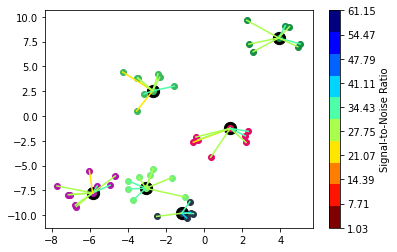

0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.276546


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/iiitd/.local/lib/python3.8/site-packages/syft/generic/frameworks/hook/hook.py:165: UserWarning: This overload of sub_ is deprecated:
	sub_(Number alpha, Tensor other)
Consider using one of the following signatures instead:
	sub_(Tensor other, *, Number alpha) (Triggered internally at  /opt/conda/conda-bld/pytorch_1595629411241/work/torch/csrc/utils/python_arg_parser

Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.305660
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.254429
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.218313
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.032927

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.322029
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.323441
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.266186
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.207871
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.097406

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Poor Channel, client not taken for averaging in this round

Power Allocated= 8.72166746824089
CSI= 0.2534095282096639
SNR

/tmp/ipykernel_682821/1497942811.py:66: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.263686
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.242922
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.212393
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.018745

Power Allocated= 4.615952915390837
CSI= 0.12419434995018475
SNR= 26.046095912767488
Client: client43
Model client43 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.343625
Model client43 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.322549
Model client43 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.228474
Model client43 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.230287
Model client43 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.137548

Power Allocated= 11.191070542340821
CSI= 0.6771496396962509
SNR= 28.739979970420112
Client: client46
Model client46 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.320019
Model client46 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.328247
Model client46 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.284028
Model client46 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.255603
Model client46 Train Epoch: 5

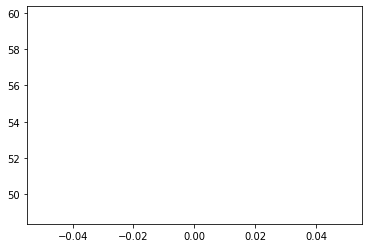

ROUND 0
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.302299
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.296813
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.200727
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.981053
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.729041

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.303034
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.298614
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.269197
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.108303
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.743026

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245

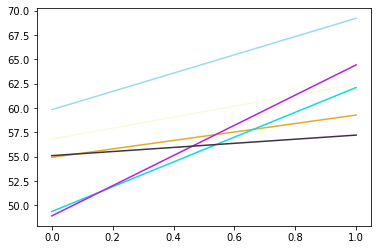

ROUND 1
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.299430
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.292833
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.176624
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.022148
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.710642

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.300850
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.278546
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.061430
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.795722
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.249382

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245

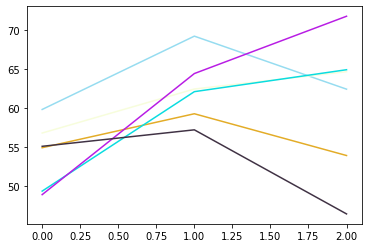

ROUND 2
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.304777
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.264977
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.002321
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.578549
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.456162

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.304027
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.299752
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.247947
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.926814
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.675097

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245

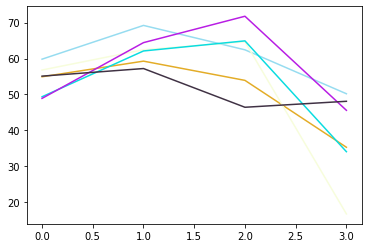

ROUND 3
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.300332
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.286104
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.189000
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.958752
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.680161

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.300652
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.288383
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.116350
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.300370
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.289283

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245

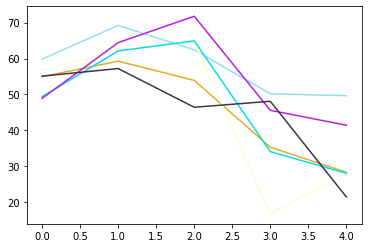

ROUND 4
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.297766
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.283341
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.125003
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.917435
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.089630

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.303781
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.301478
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.198062
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.927264
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.088958

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245

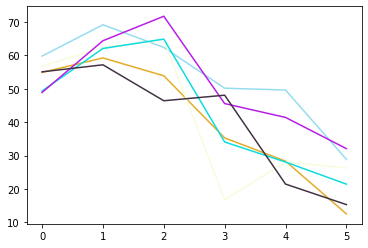

ROUND 5
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.302757
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.287556
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.205688
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.961530
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.543031

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.301269
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.285841
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.234846
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.899155
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.857266

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245

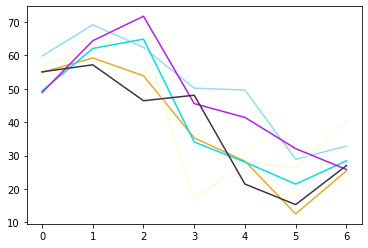

ROUND 6
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.301803
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.300869
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.134436
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.873469
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.010176

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.302993
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.300017
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.202870
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.708752
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.747594

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245

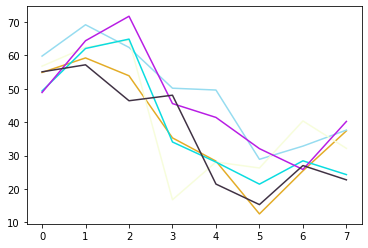

ROUND 7
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.300603
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.297059
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.104875
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.975880
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.043538

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.304264
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.312186
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.240180
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.161428
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.707186

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245

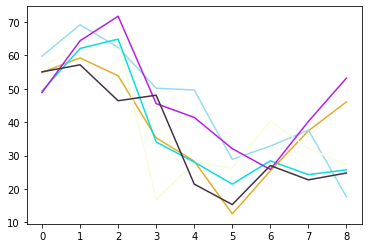

ROUND 8
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.300179
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.277886
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.318866
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.198701
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.957320

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.296693
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.274055
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.035003
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.839422
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.422295

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245

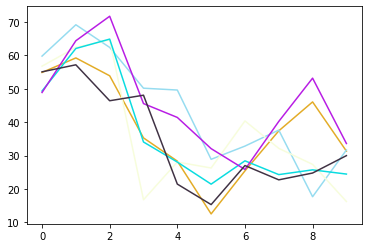

ROUND 9
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.304232
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.275644
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.089284
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.733875
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.348910

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.305707
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.280206
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.127350
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.812369
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.102619

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245

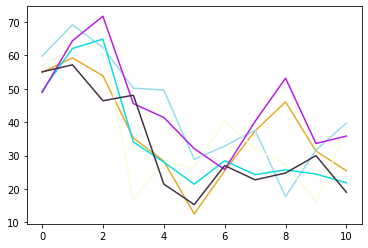

ROUND 10
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.300534
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.282826
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.187231
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.827318
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.759133

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Model client32 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.301803
Model client32 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.304471
Model client32 Train Epoch: 3 [0/1216 (0%)]	Loss: 2

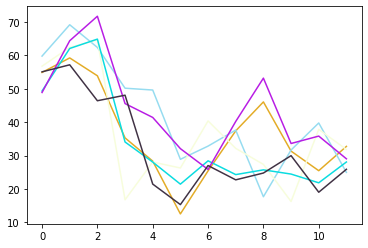

ROUND 11
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.298640
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.281912
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.190650
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.108472
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.158698

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.299242
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.289514
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.140996
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.925840
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.556923

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

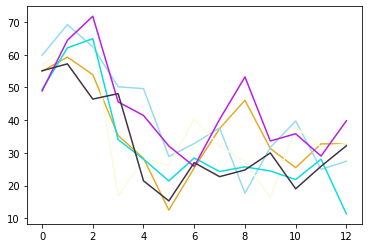

ROUND 12
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.309317
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.290601
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.211802
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.986820
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.852561

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.305129
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.270747
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.099265
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.668788
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.835377

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

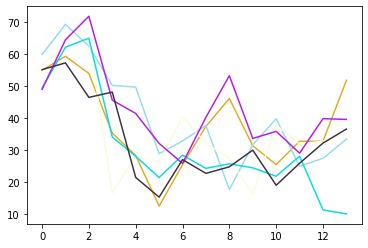

ROUND 13
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.293665
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.273355
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.175037
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.935828
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.667040

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.297320
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.290934
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.223624
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.933696
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.940062

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

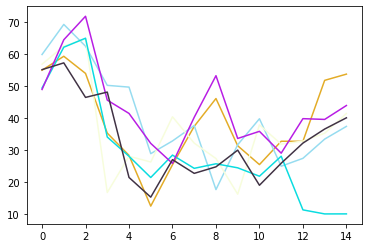

ROUND 14
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.291531
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.252735
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.999176
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.708012
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.745652

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.297908
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.250069
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.948317
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.651000
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.459024

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

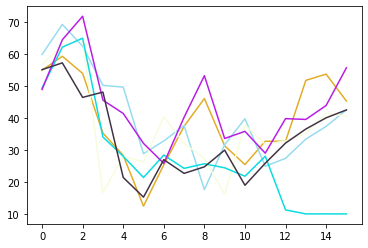

ROUND 15
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.297891
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.265928
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.155208
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.918283
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.302238

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.299496
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.291461
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.134855
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.975789
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.690267

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

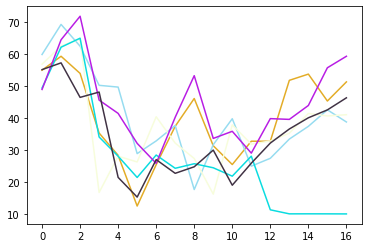

ROUND 16
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.297628
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.259671
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.138152
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.033068
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.126586

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.299054
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.263616
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.151521
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.637474
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.412683

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

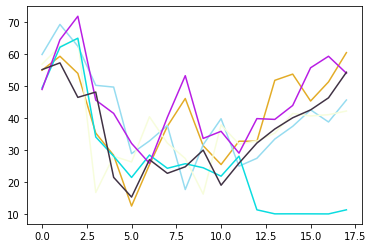

ROUND 17
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.303082
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.258604
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.123322
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.851085
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.787963

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Model client32 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.302785
Model client32 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.279334
Model client32 Train Epoch: 3 [0/1216 (0%)]	Loss: 2

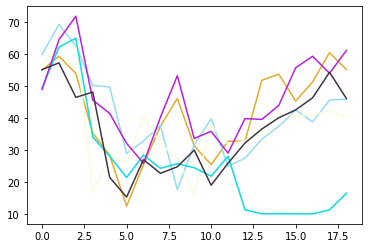

ROUND 18
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.296866
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.276015
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.174040
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.016819
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.662969

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Model client32 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.304821
Model client32 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.260288
Model client32 Train Epoch: 3 [0/1216 (0%)]	Loss: 2

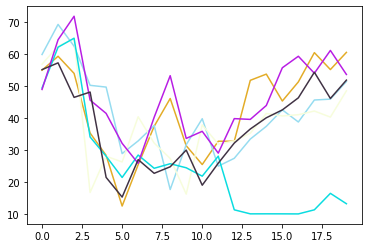

ROUND 19
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.297308
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.263378
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.162782
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.813606
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.216197

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.301052
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.232754
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.001932
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.690979
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.105641

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

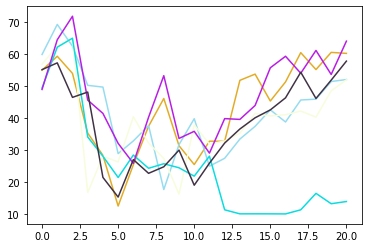

ROUND 20
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.291107
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.266494
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.069156
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.951528
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.511743

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.297410
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.206862
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.022105
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.626213
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.806430

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

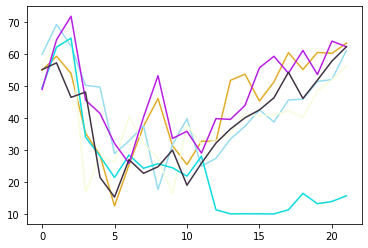

ROUND 21
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.297736
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.248886
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.969072
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.397985
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.417647

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.294280
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.241070
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.997764
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.591747
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.730207

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

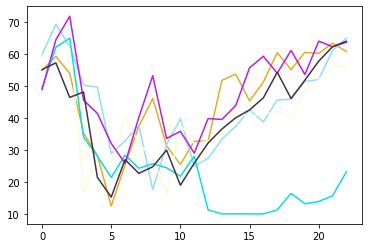

ROUND 22
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.293474
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.239502
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.011020
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.081069
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.413238

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.284157
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.207447
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.985901
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.650946
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.690823

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

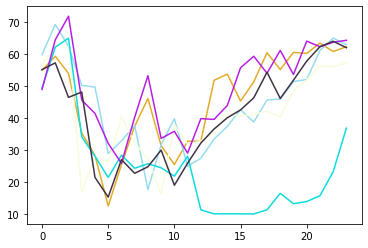

ROUND 23
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.292411
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.268068
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.039592
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.726882
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.727847

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.294261
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.196094
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.019467
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.568691
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.319657

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

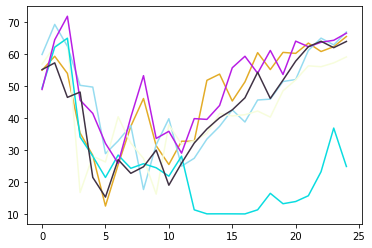

ROUND 24
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.294570
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.215906
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.174204
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.927822
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.834697

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.292341
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.165730
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.815136
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.669697
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.304387

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

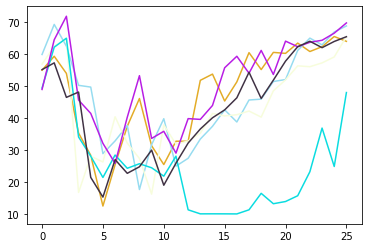

ROUND 25
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.296554
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.170172
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.031911
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.641230
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.758091

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.290049
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.131152
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.538178
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.298277
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.701380

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

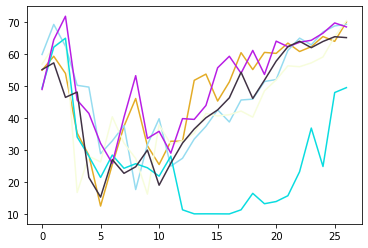

ROUND 26
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.283784
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.176979
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.797675
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.446352
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.533084

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.282139
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.172804
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.005574
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.521233
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.589748

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

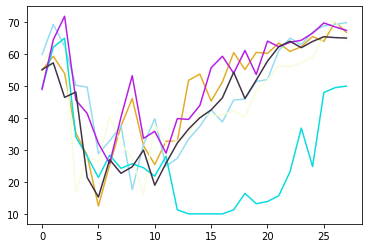

ROUND 27
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.291159
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.133093
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.895669
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.245695
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.794603

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.284243
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.220544
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.771905
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.249058
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.107965

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

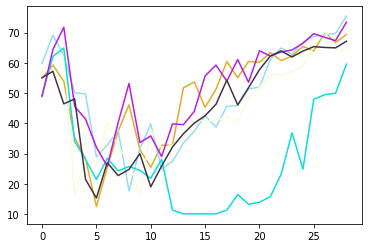

ROUND 28
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.277806
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.146811
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.976743
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.425556
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.498592

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.286029
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.035565
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.576198
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.218733
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.314005

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

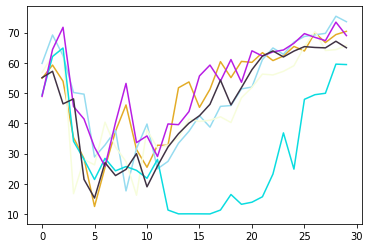

ROUND 29
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.294190
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.138949
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.610284
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.365754
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.559981

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.281825
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.101753
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.483800
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.300792
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.256554

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

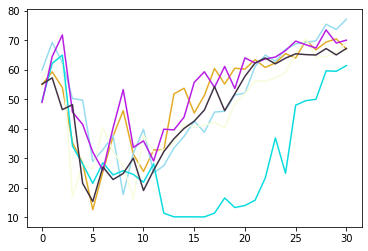

ROUND 30
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.274729
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.147138
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.719172
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.242536
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.509387

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.290385
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.108477
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.606801
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.259375
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.697302

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

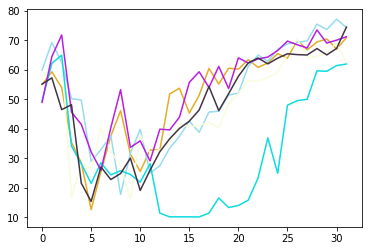

ROUND 31
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.279332
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.094173
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.608174
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.315462
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.533240

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.293692
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.031647
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.443288
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.256702
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.755589

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

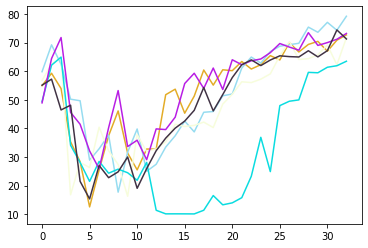

ROUND 32
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.284562
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.126177
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.561765
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.952284
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.106241

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.291359
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.053155
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.479425
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.120583
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.410948

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

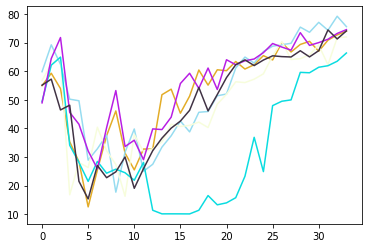

ROUND 33
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.281198
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.940509
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.441318
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.137421
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.451243

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Poor Channel, client not taken for averaging in this round

Power Allocated= 8.72166746824089
CSI= 0.2534095282096639
SNR= 23.96246557447082
Client: client37
Model clien

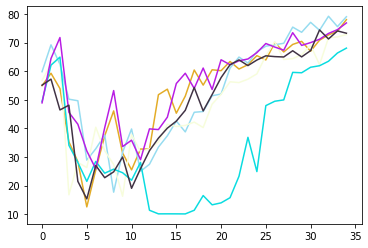

ROUND 34
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.269770
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.926486
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.538577
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.039126
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.982649

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.277636
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.960909
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.510094
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.074530
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.330126

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

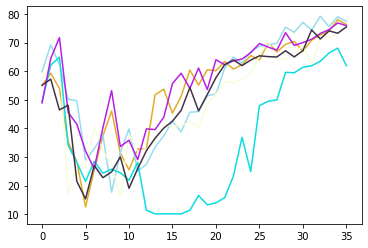

ROUND 35
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.289365
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.047185
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.484594
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.880837
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.808119

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.265014
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.955457
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.288487
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.134842
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.919576

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

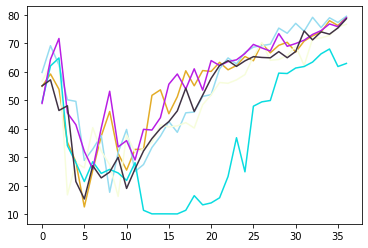

ROUND 36
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.277231
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.960534
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.365199
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.905186
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.922657

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.277957
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.857226
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.209370
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.964124
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.213438

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

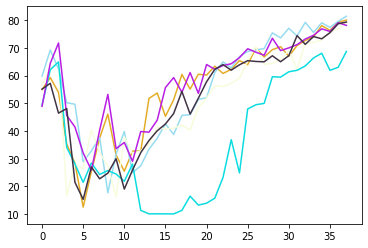

ROUND 37
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.258767
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.926384
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.290103
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.864649
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.643731

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.254322
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.751414
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.172029
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.078553
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.366490

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

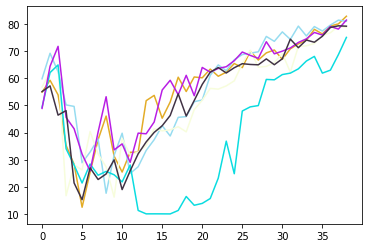

ROUND 38
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.264385
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.876894
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.251925
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.026028
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.864874

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.228947
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.707610
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.983200
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.817055
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.821772

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

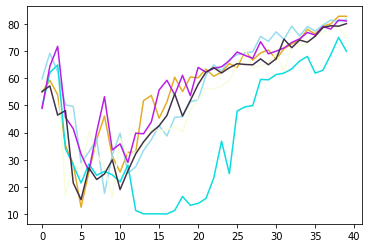

ROUND 39
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.272197
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.846169
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.338979
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.199027
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.421415

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.254560
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.756721
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.192411
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.371901
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.348969

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

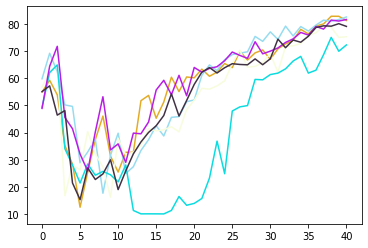

ROUND 40
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.245649
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.871399
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.045693
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.932577
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.588962

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.234844
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.571714
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.968638
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.770244
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.870926

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

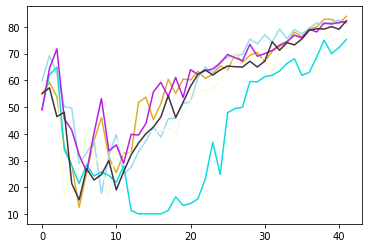

ROUND 41
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.230486
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.773301
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.138758
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.151145
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.037611

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.230951
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.640466
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.030070
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.312329
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.865195

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

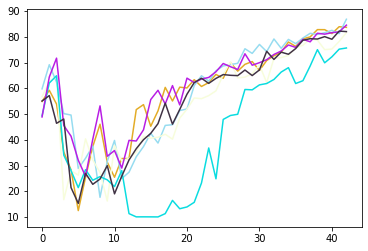

ROUND 42
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.288003
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.822155
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.090982
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.004107
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.317970

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.222226
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.494297
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.868765
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.213380
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.827908

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

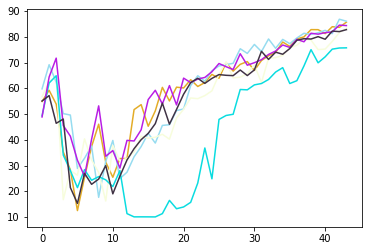

ROUND 43
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.199049
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.522140
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.975530
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.913823
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.054850

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Model client32 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.253813
Model client32 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.684658
Model client32 Train Epoch: 3 [0/1216 (0%)]	Loss: 1

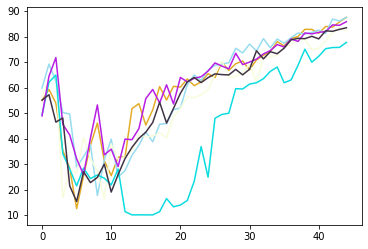

ROUND 44
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.236625
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.730201
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.949280
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.032667
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.034321

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.238390
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.275025
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.713967
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.696132
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.722144

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

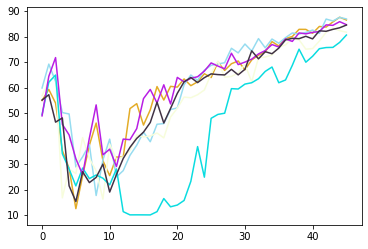

ROUND 45
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.235089
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.403256
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.842367
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.414220
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.850153

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Model client32 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.253083
Model client32 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.707024
Model client32 Train Epoch: 3 [0/1216 (0%)]	Loss: 1

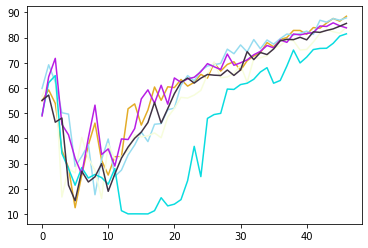

ROUND 46
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.181961
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.594270
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.030640
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.975512
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.267984

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.246583
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.151655
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.711792
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.150298
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.102309

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

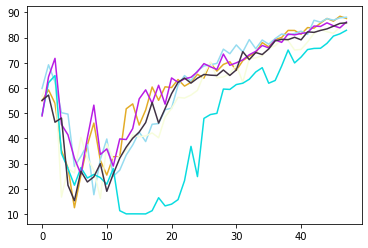

ROUND 47
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.241090
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.596909
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.013651
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.027214
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.056770

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.187096
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.199010
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.737337
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.907268
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.280129

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

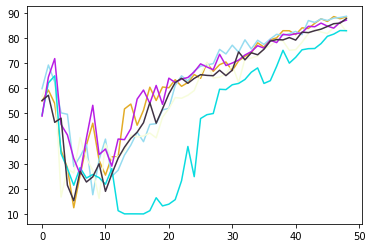

ROUND 48
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.211217
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.561455
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.834473
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.019000
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.861851

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.233467
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.659240
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.844686
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.602100
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.633133

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

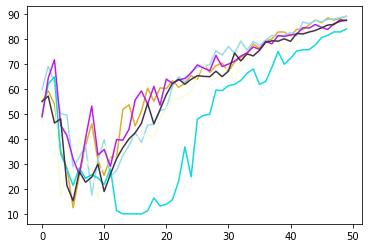

ROUND 49
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.159838
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.327369
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.733398
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.166171
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.566477

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.176538
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.334812
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.587619
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.946984
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.988461

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

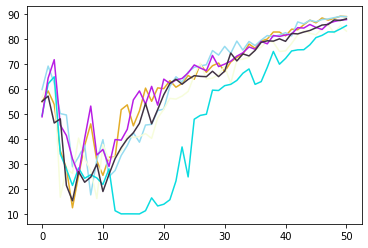

ROUND 50
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.194423
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.517171
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.792917
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.676363
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.097243

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.196699
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.189769
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.539686
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.178945
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.496700

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

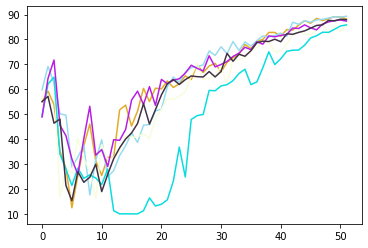

ROUND 51
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.140835
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.403476
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.943737
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.242444
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.935255

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.184419
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.082395
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.772995
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.562620
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.272705

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

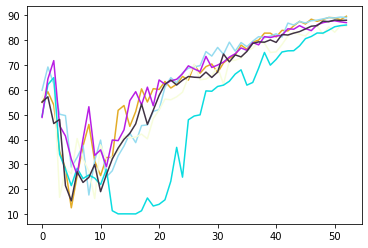

ROUND 52
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.123220
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.325925
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.998018
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.312691
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.702876

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.154094
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.282081
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.561446
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.100975
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.578405

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

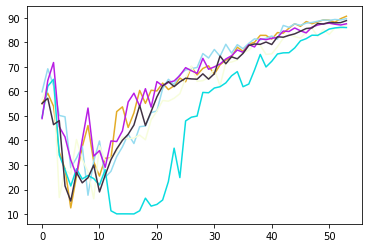

ROUND 53
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.125234
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.472521
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.687966
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.776520
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.135832

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.104209
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.041534
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.572465
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.032786
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.213251

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

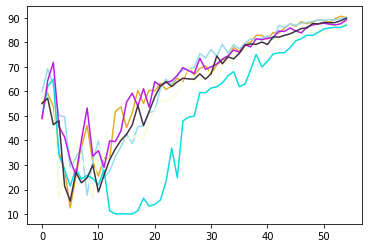

ROUND 54
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.073062
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.080925
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.596631
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.911201
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.930920

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.080791
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.108489
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.545965
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.857905
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.974211

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

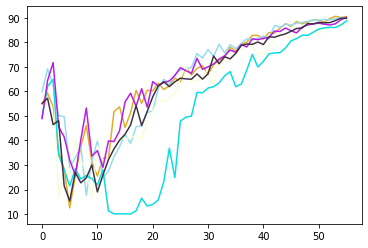

ROUND 55
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.053638
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.047935
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.691089
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.622933
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.273611

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Model client32 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.114301
Model client32 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.036810
Model client32 Train Epoch: 3 [0/1216 (0%)]	Loss: 0

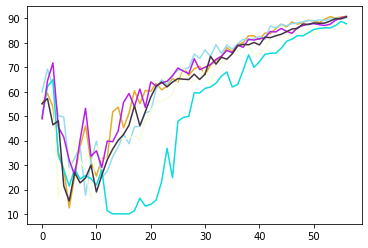

ROUND 56
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.970078
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.157569
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.856751
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.743697
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.309595

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.057491
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.809682
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.662271
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.007467
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.683719

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

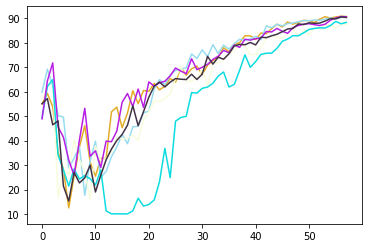

ROUND 57
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.973468
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.911543
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.488772
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.637275
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.712066

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Model client32 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.008828
Model client32 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.036115
Model client32 Train Epoch: 3 [0/1216 (0%)]	Loss: 0

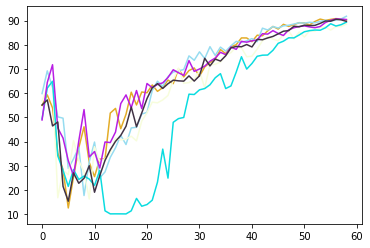

ROUND 58
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.950266
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.088228
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.685643
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.818027
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.807589

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.010047
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.857985
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.729922
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.934469
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.039111

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

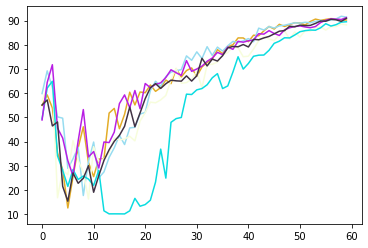

ROUND 59
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.988508
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.128892
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.765468
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.647222
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.547765

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.940162
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.627293
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.422513
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.537492
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.022182

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

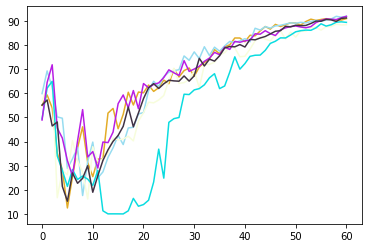

ROUND 60
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.990224
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.881010
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.639457
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.341520
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.485976

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.994200
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.779970
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.612773
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.733836
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.437269

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

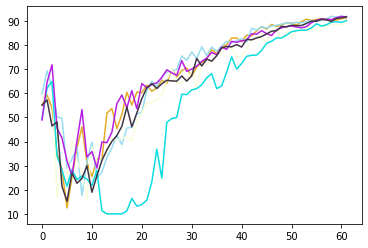

ROUND 61
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.151368
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.985080
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.899584
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.682657
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.308691

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.155114
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.967894
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.472001
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.723778
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.481334

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

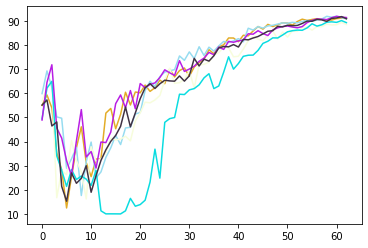

ROUND 62
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.957812
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.796862
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.603180
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.828989
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.438979

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.970779
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.692421
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.699826
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.175323
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.680696

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

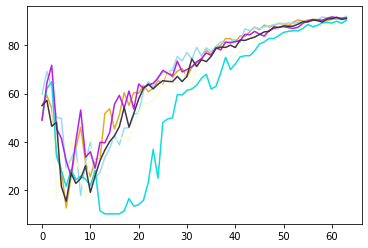

ROUND 63
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.919065
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.887263
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.658762
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.717903
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.054815

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.852145
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.811983
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.605063
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.094001
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.899425

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

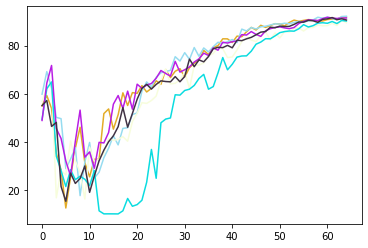

ROUND 64
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.863176
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.627200
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.594655
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.485406
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.610420

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Model client32 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.894331
Model client32 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.824536
Model client32 Train Epoch: 3 [0/1216 (0%)]	Loss: 0

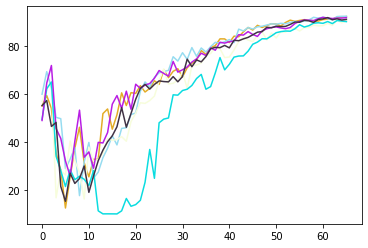

ROUND 65
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.901440
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.675132
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.435451
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.946862
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.437587

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.802950
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.602202
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.570276
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.387893
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.181515

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

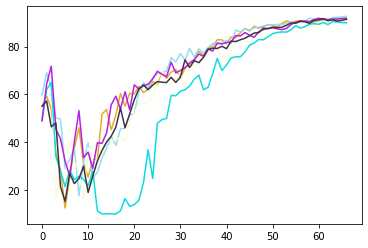

ROUND 66
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.922694
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.939318
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.609359
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.656844
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.378182

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.878698
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.986733
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.670941
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.958204
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.522234

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

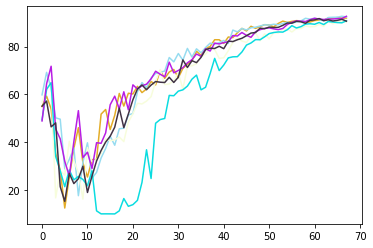

ROUND 67
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.842691
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.656186
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.380635
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.495087
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.500546

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.776742
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.779939
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.779644
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.658793
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.753361

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

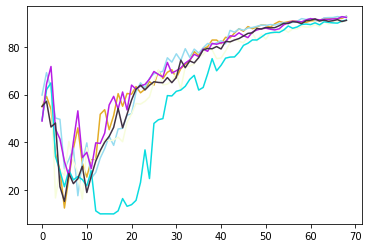

ROUND 68
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.838059
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.566678
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.371075
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.545916
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.588281

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.760298
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.619373
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.640690
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.587835
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.040866

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

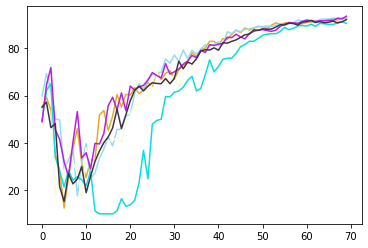

ROUND 69
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.991106
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.665177
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.439522
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.530789
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.566157

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.951239
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.588698
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.596738
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.728110
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.988583

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

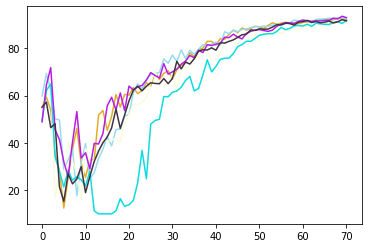

ROUND 70
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.807343
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.773621
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.473593
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.002797
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.555188

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.716519
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.723561
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.725375
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.595229
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.603582

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

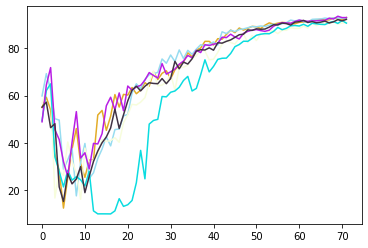

ROUND 71
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.800121
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.531512
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.497705
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.613383
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.725165

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.845257
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.472541
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.458748
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.731888
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.530685

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

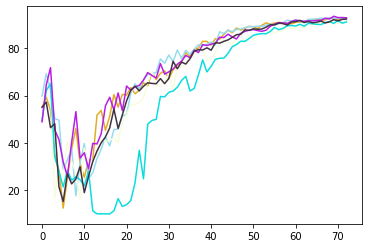

ROUND 72
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.768358
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.733574
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.479821
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.921411
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.043502

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.767500
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.528499
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.540148
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.679748
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.989385

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

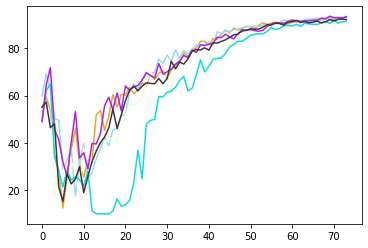

ROUND 73
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.789551
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.551413
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.523320
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.433421
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.554012

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Model client32 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.814520
Model client32 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.041116
Model client32 Train Epoch: 3 [0/1216 (0%)]	Loss: 0

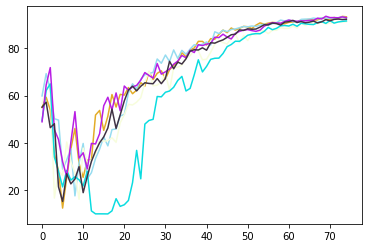

ROUND 74
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.845914
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.751256
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.989314
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.623123
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.746827

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.776613
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.345839
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.367642
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.272328
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.825406

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

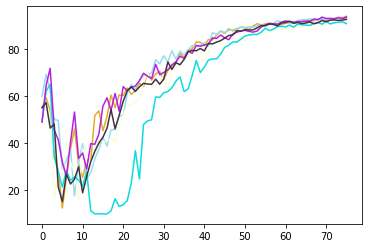

ROUND 75
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.644485
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.741669
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.612577
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.065625
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.442631

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.744691
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.576789
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.515952
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.613991
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.049825

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

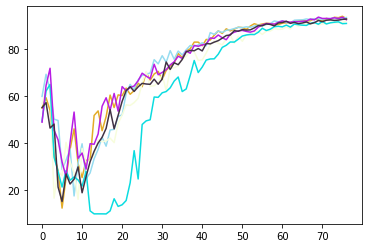

ROUND 76
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.715871
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.748405
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.748590
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.635782
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.582304

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.583392
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.894858
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.511167
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.719257
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.987310

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

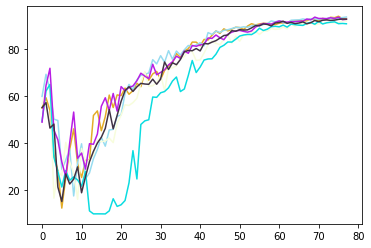

ROUND 77
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.675605
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.579312
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.276058
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.868997
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.667799

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Model client32 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.586930
Model client32 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.534604
Model client32 Train Epoch: 3 [0/1216 (0%)]	Loss: 0

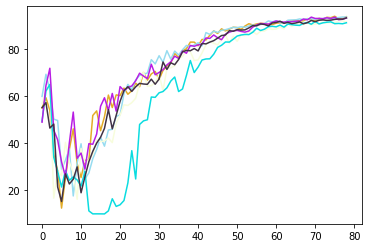

ROUND 78
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.923215
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.617719
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.826944
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.012228
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.873761

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.891801
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.556038
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.543335
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.477328
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.602238

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

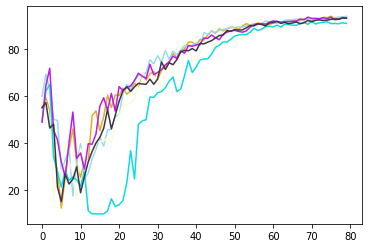

ROUND 79
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.631195
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.636130
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.648616
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.564332
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.434768

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.608085
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.396207
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.416072
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.016120
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.381159

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

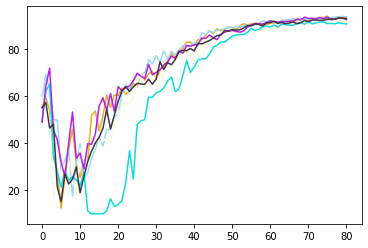

ROUND 80
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.862288
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.501256
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.578102
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.791302
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.018340

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.764784
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.480136
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.365929
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.753817
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.218192

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

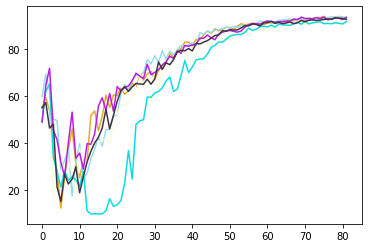

ROUND 81
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.561260
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.599170
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.433408
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.974596
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.675580

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.629706
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.527893
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.558482
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.797431
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.938627

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

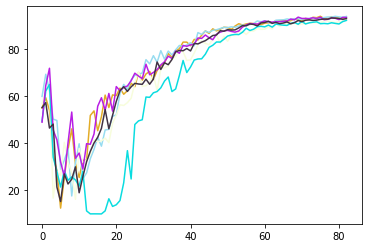

ROUND 82
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.550859
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.554862
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.498356
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.313947
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.325197

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Model client32 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.615036
Model client32 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.475545
Model client32 Train Epoch: 3 [0/1216 (0%)]	Loss: 0

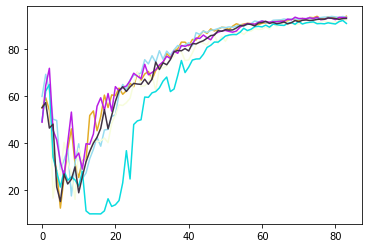

ROUND 83
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.584409
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.520094
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.396859
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.416983
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.528818

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.652706
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.479087
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.713921
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.670862
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.335317

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

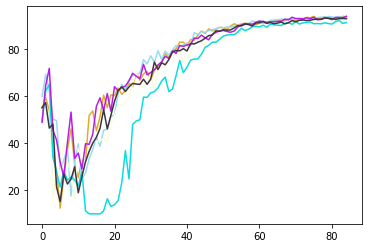

ROUND 84
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.655613
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.570886
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.367639
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.607251
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.808187

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.663583
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.418454
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.612574
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.140118
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.926742

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

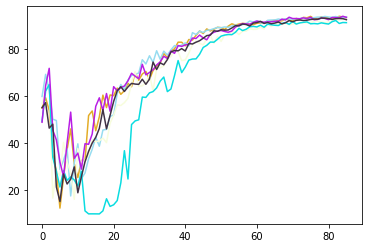

ROUND 85
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.604353
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.498086
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.798865
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.843573
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.855805

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.602431
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.531001
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.795124
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.357725
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.932950

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

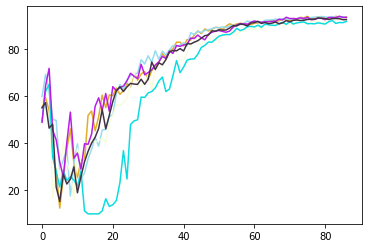

ROUND 86
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.486054
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.473786
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.541336
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.362791
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.262280

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Model client32 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.477660
Model client32 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.469514
Model client32 Train Epoch: 3 [0/1216 (0%)]	Loss: 0

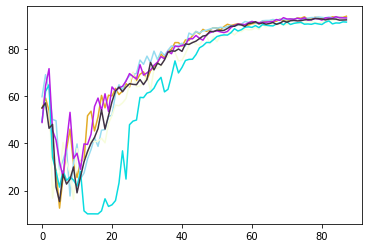

ROUND 87
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.538356
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.628394
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.547347
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.149935
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.221046

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.509717
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.439261
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.772957
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.078512
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.545734

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

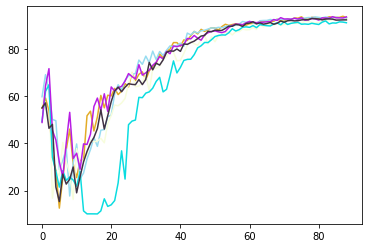

ROUND 88
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.767461
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.734096
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.544605
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.956597
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.350080

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.681811
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.703870
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.637812
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.207949
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.964786

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

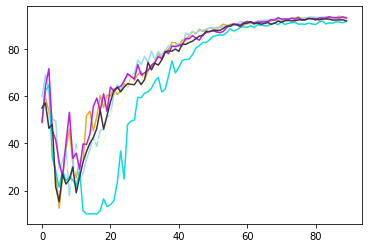

ROUND 89
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.585976
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.718270
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.527825
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.891394
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.612574

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.523741
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.799262
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.547513
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.564569
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.013985

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

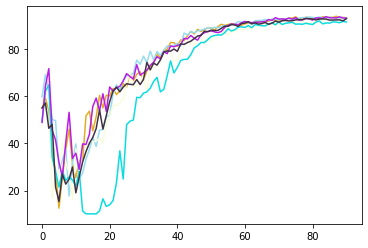

ROUND 90
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.691675
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.749888
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.546903
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.977318
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.708845

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.697769
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.477103
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.363259
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.528397
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.671441

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

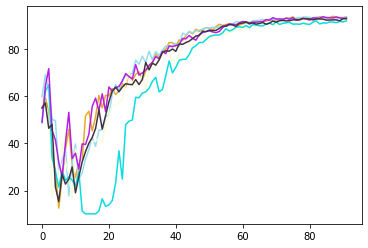

ROUND 91
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.553398
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.553671
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.701305
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.745160
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.526806

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Model client32 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.443439
Model client32 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.543274
Model client32 Train Epoch: 3 [0/1216 (0%)]	Loss: 0

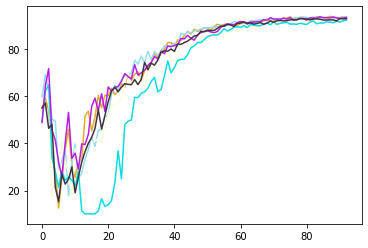

ROUND 92
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.508325
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.723851
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.415983
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.725613
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.689995

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.450985
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.505848
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.420726
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.384337
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.691649

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

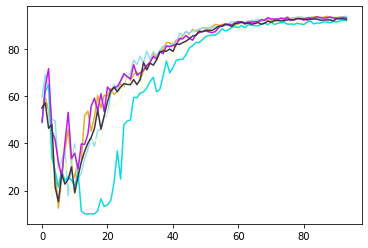

ROUND 93
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.698903
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.703841
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.709002
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.453136
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.980656

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.694984
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.488175
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.024804
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.760601
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.864233

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

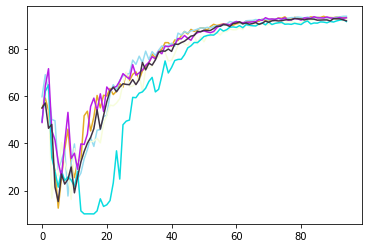

ROUND 94
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.587947
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.763037
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.760199
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.649234
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.412647

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.504339
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.723526
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.654289
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.946401
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.667318

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

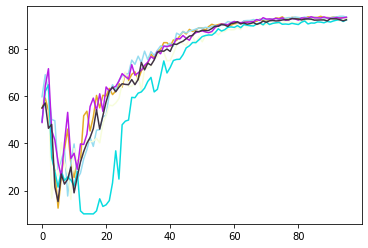

ROUND 95
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.339346
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.348545
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.514537
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.600744
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.473637

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Poor Channel, client not taken for averaging in this round

Power Allocated= 8.72166746824089
CSI= 0.2534095282096639
SNR= 23.96246557447082
Client: client37
Model clien

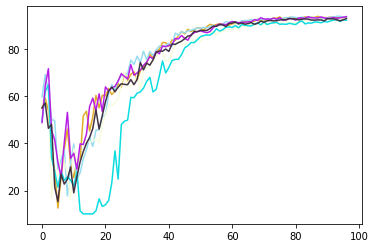

ROUND 96
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.596014
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.649142
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.723552
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.757570
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.728923

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.720747
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.635889
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.702831
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.883027
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.892301

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

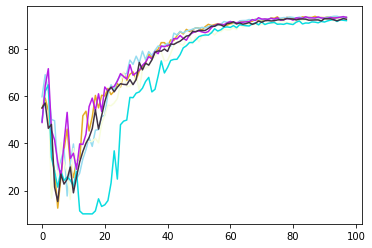

ROUND 97
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.381275
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.293627
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.574757
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.750914
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.224668

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Model client32 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.468875
Model client32 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.663937
Model client32 Train Epoch: 3 [0/1216 (0%)]	Loss: 0

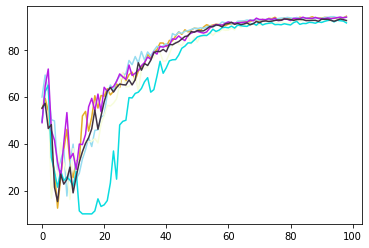

ROUND 98
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.404250
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.453181
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.351839
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.461267
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.501814

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.449151
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.757555
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.908478
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.775166
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.905777

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

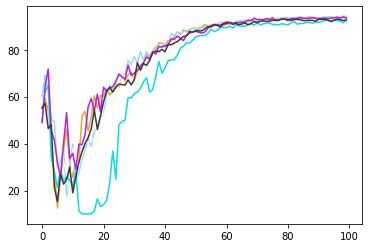

ROUND 99
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.331944
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.501628
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.721602
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.932480
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.962075

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.380658
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.549146
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.666095
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.241533
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.297350

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.28668087246424

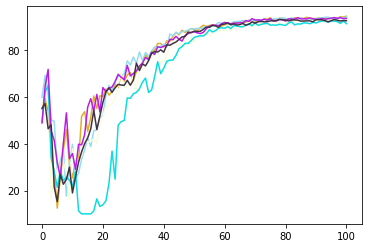

ROUND 100
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.402783
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.514384
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.642161
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.039886
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.826883

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.332613
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.299945
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.529458
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.986323
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.358221

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

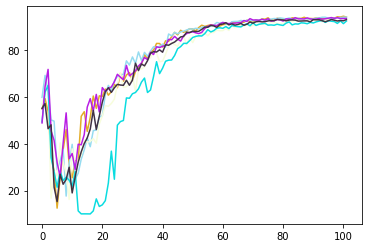

ROUND 101
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.351070
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.436058
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.519723
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.615773
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.616451

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.291012
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.407134
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.401782
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.949208
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.551653

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

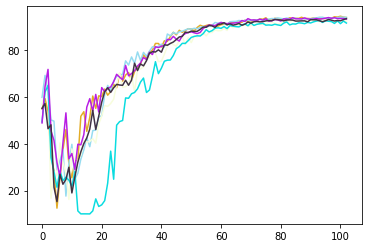

ROUND 102
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.587464
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.536537
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.852163
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.789484
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.109309

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.528365
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.693851
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.177159
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.747212
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.677427

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

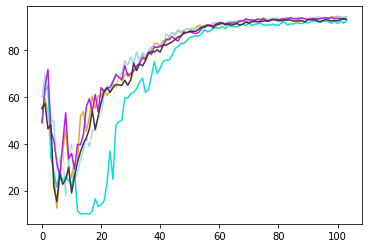

ROUND 103
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.338411
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.535205
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.649882
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.474331
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.835384

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.287476
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.393762
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.551500
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.447213
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.752460

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

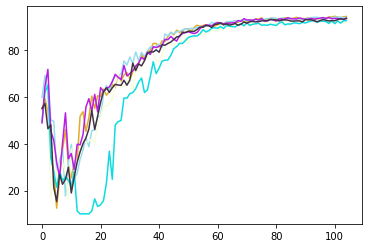

ROUND 104
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.253855
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.576006
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.398997
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.630005
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.558851

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.389236
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.318030
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.236448
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.797286
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.876138

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

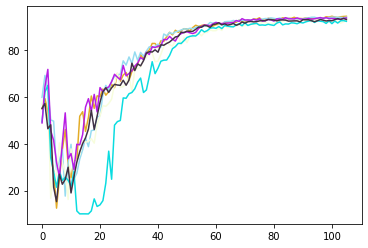

ROUND 105
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.382471
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.754210
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.658434
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.639901
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.102768

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.279857
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.653356
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.916185
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.948157
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.386956

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

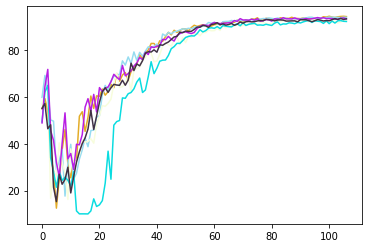

ROUND 106
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.390287
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.526547
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.666367
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.391447
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.294368

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.308937
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.506464
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.698458
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.884197
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.712837

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

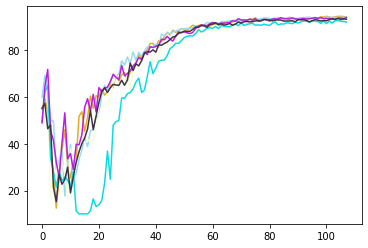

ROUND 107
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.480764
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.500076
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.685099
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.822178
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.930756

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.598342
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.561134
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.463602
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.428814
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.779605

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

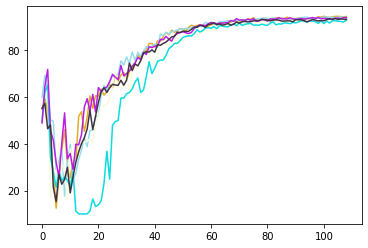

ROUND 108
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.327192
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.463230
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.518327
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.892161
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.430055

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.329109
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.383787
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.463916
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.645774
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.181600

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

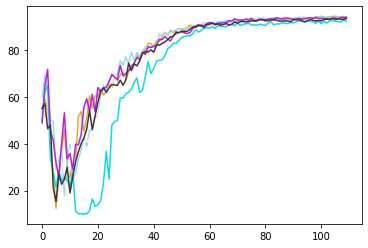

ROUND 109
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.339969
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.428777
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.807625
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.097723
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.502448

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.196003
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.314005
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.306660
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.682558
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.108137

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

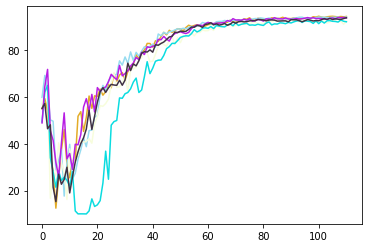

ROUND 110
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.638793
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.469267
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.456335
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.054915
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.282377

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.500462
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.417156
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.609321
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.695355
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.213432

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

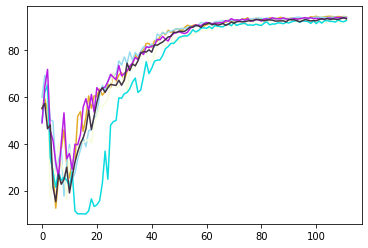

ROUND 111
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.290781
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.377989
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.565188
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.181266
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 5.404657

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Model client32 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.179384
Model client32 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.598943
Model client32 Train Epoch: 3 [0/1216 (0%)]	Loss: 

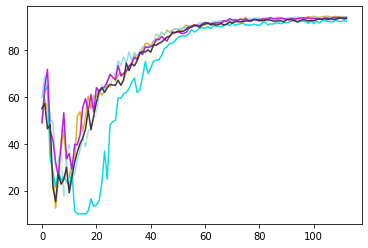

ROUND 112
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.252417
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.512397
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.356533
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.469738
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 3.973365

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.350039
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.566335
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.867926
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.484007
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.043513

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

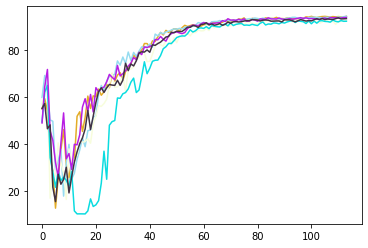

ROUND 113
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.461278
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.649526
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.578146
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.550133
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.304607

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.535104
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.880518
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.481484
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.117447
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.891051

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

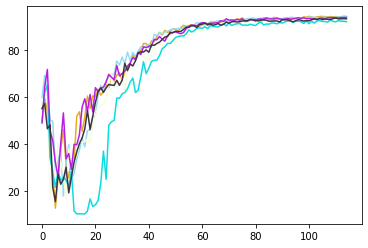

ROUND 114
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.545484
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.570907
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.479920
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.003533
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.942956

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.623701
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.709847
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.741910
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.354777
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.785532

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

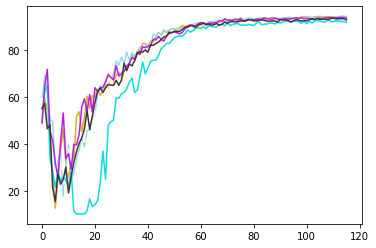

ROUND 115
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.069006
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.512575
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.435457
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.064112
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.578055

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.194494
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.450589
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.686560
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.673371
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.656261

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

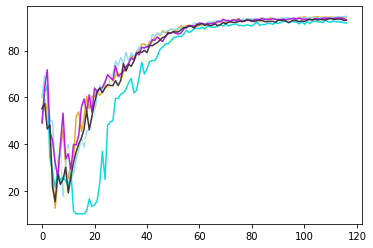

ROUND 116
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.298297
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.577860
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.629175
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.824770
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.974424

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.250593
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.638422
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.591169
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.906098
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.855609

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

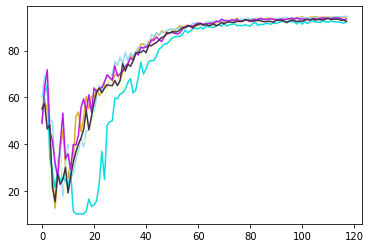

ROUND 117
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.147221
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.521434
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.486844
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.641180
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.045390

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.364402
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.313642
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.477857
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.004781
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.463745

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

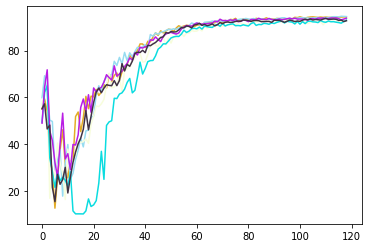

ROUND 118
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.161160
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.558504
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.303256
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.823504
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.077818

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.243323
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.451154
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.609560
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.497122
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.902852

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

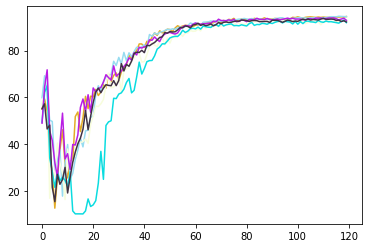

ROUND 119
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.153438
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.367470
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.278355
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.826050
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.637137

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.126520
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.436155
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.539476
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.757966
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.355153

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

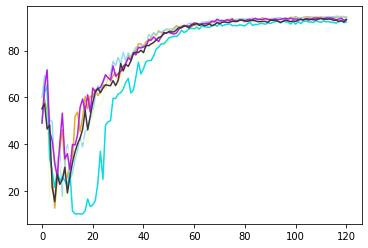

ROUND 120
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.554940
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.453613
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.491690
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.464743
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.951496

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.354684
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.537978
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.462507
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.561739
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.966256

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

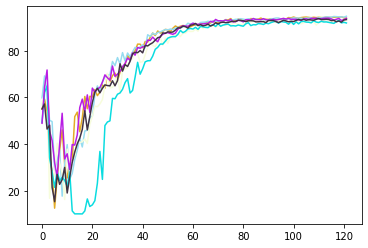

ROUND 121
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.232026
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.341423
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.368338
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.535679
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.953804

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.067267
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.387065
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.536723
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.441406
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.431823

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

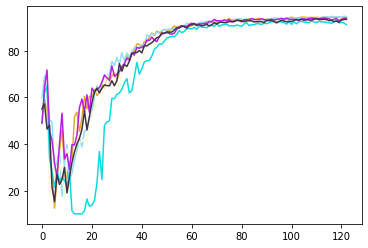

ROUND 122
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.190045
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.325633
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.451309
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.989378
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.294985

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.175152
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.523029
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.752053
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.496904
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.810381

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

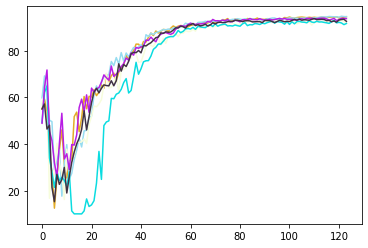

ROUND 123
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.043852
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.540624
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.581069
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.532914
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.839206

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.153337
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.362692
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.662933
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.473318
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.631709

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

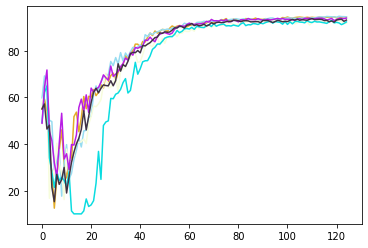

ROUND 124
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.190390
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.285599
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.256602
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.573556
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.261176

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.093614
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.299597
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.381973
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.356062
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.403539

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

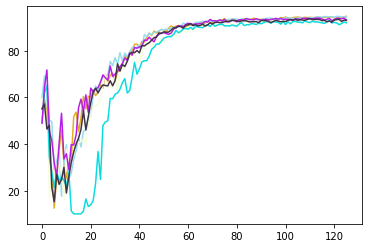

ROUND 125
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.051787
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.220837
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.749296
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.361797
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.185250

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Poor Channel, client not taken for averaging in this round

Power Allocated= 8.72166746824089
CSI= 0.2534095282096639
SNR= 23.96246557447082
Client: client37
Poor Chann

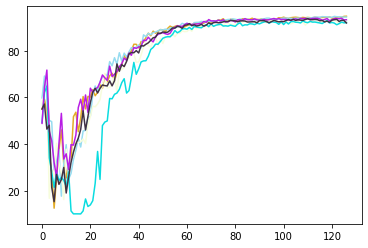

ROUND 126
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.121012
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.310732
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.294681
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.561378
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.857809

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Poor Channel, client not taken for averaging in this round

Power Allocated= 8.72166746824089
CSI= 0.2534095282096639
SNR= 23.96246557447082
Client: client37
Model clie

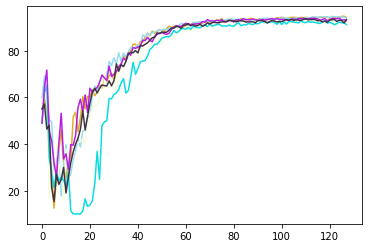

ROUND 127
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.309556
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.549410
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.443093
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.923726
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.167868

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.438208
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.649482
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.802869
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.583826
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.915438

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

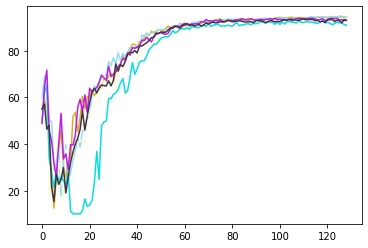

ROUND 128
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.263199
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.452529
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.391792
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.711718
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.056072

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.157515
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.482774
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.686928
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.139631
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.065121

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

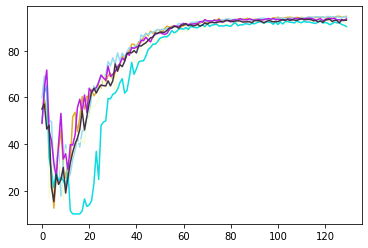

ROUND 129
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.437576
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.526981
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.394920
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.581454
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.518388

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.436751
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.743137
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.839702
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.554432
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.536442

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

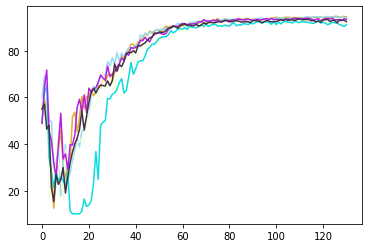

ROUND 130
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.078091
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.624663
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.855091
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.360300
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.378492

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.068260
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.448188
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.544316
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.525639
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.813999

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

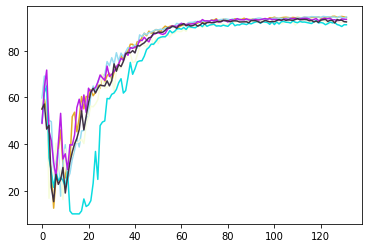

ROUND 131
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.259712
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.400184
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.465050
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.894898
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.521800

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.474930
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.522273
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.557435
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.876709
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.270723

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

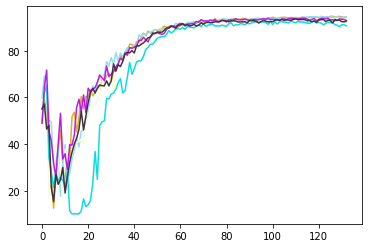

ROUND 132
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.294726
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.321309
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.349166
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.397168
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 3.358040

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.354417
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.485134
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.967762
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.704286
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.928372

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

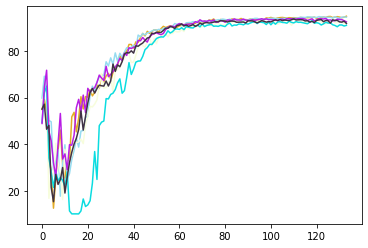

ROUND 133
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.088350
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.484457
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.294301
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.741751
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.221229

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.170758
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.363815
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.533027
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.611874
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.237695

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

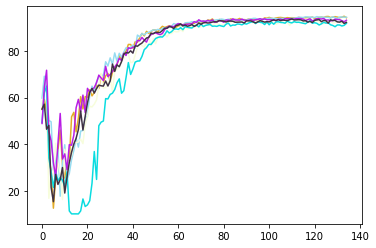

ROUND 134
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.138706
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.934713
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.766994
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.667177
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.823785

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Poor Channel, client not taken for averaging in this round

Power Allocated= 8.72166746824089
CSI= 0.2534095282096639
SNR= 23.96246557447082
Client: client37
Model clie

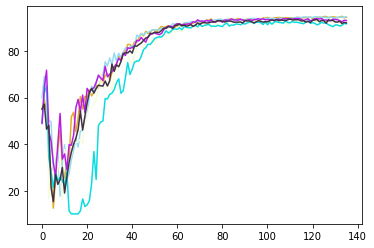

ROUND 135
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.130592
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.441287
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.876781
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.700171
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.729345

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.001580
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.439588
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.620988
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.019677
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.501735

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

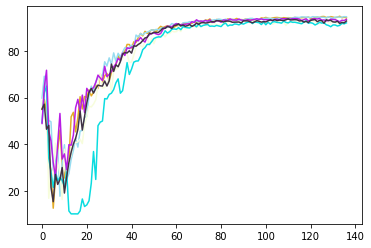

ROUND 136
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.171626
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.297721
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.669717
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.359638
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.190843

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.137941
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.599895
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.733428
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.342811
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.388561

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

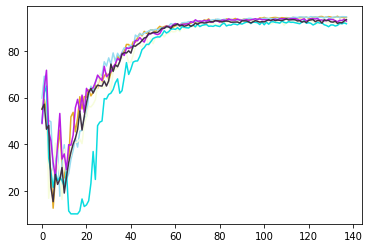

ROUND 137
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.056624
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.554816
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.725165
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.880165
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.934489

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.027835
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.339514
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.564051
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.732919
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.527555

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

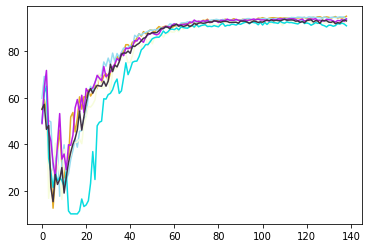

ROUND 138
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.990838
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.471853
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.716471
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.745734
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.017494

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.080720
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.389161
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.456141
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.466869
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.295902

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

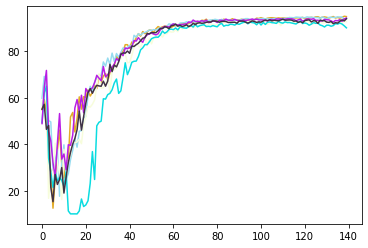

ROUND 139
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.789816
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.337327
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.969197
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.551865
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.625432

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.746194
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.511200
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.734879
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.492607
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 3.090806

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

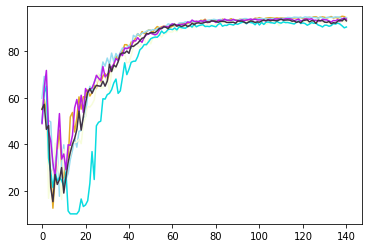

ROUND 140
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.115611
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.465844
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.075796
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.327728
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.949008

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.177449
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.935431
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.781175
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.013529
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.738213

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

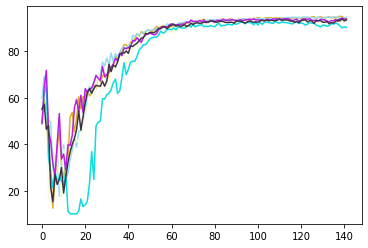

ROUND 141
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.388251
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.398169
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.633363
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.467207
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.546730

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.322853
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.442910
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.779385
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.769937
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.554438

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

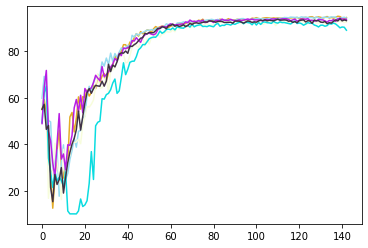

ROUND 142
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.049269
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.451844
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.636995
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.873624
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.336448

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.974275
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.438354
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.861382
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.599393
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.660486

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

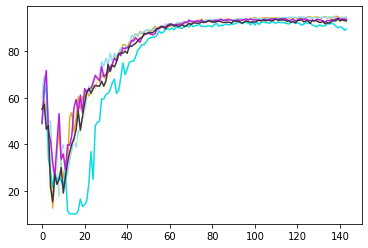

ROUND 143
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.087233
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.452702
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.514953
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.491314
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.280170

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.037925
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.419315
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.853446
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.486352
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.757098

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

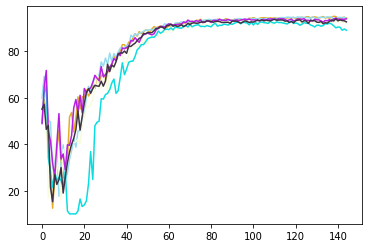

ROUND 144
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.974019
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.253763
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.331359
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.851462
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.495564

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Model client32 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.176461
Model client32 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.628814
Model client32 Train Epoch: 3 [0/1216 (0%)]	Loss: 

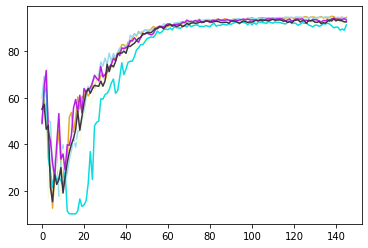

ROUND 145
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.079077
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.274593
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.211155
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.648147
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.038328

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.015182
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.400409
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.703333
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.782680
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.827004

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

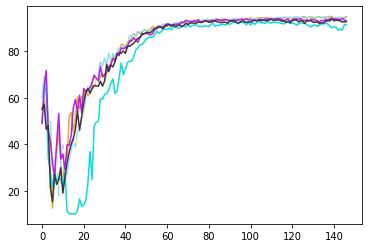

ROUND 146
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.147610
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.506932
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.311619
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.293743
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.234828

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.082001
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.630254
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.083096
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.035164
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.840072

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

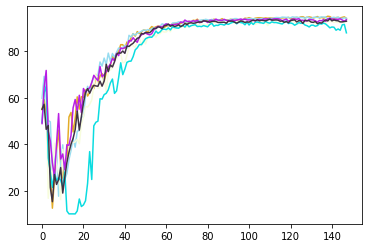

ROUND 147
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.016832
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.459838
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.447136
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.896077
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.523946

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.012451
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.414826
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.481472
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.987489
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.669142

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

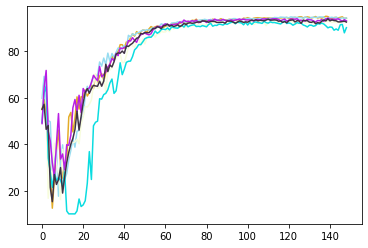

ROUND 148
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.979880
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.600047
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.927498
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.096244
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.482796

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Model client32 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.253734
Model client32 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.308728
Model client32 Train Epoch: 3 [0/1216 (0%)]	Loss: 

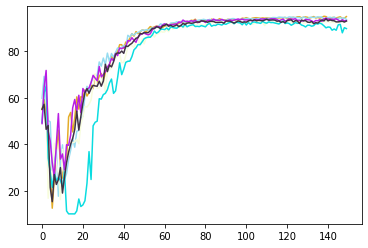

ROUND 149
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.002633
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.352676
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.523757
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.751931
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.641705

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.979149
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.378967
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.523932
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.729107
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.281096

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

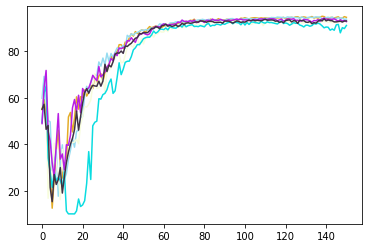

ROUND 150
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.967413
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.534908
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.392112
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.032448
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.739197

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.928985
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.349757
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.636553
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.723628
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.378008

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

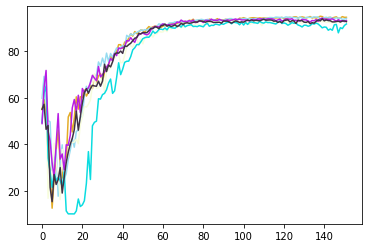

ROUND 151
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.986688
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.405668
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.378191
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.389886
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.823318

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.973297
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.385198
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.346782
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.768091
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.842029

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

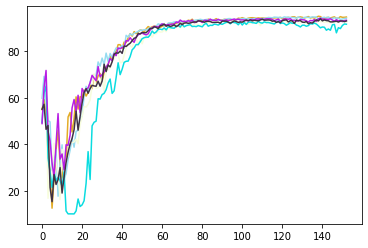

ROUND 152
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.023542
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.557547
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.360517
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.488308
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.608445

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.050088
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.449018
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.582055
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.177220
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.964462

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

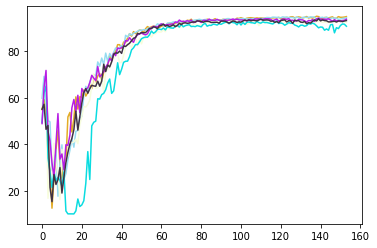

ROUND 153
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.035416
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.618241
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.721909
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.025630
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.807829

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.933174
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.566437
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.570445
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.627006
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 3.872756

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

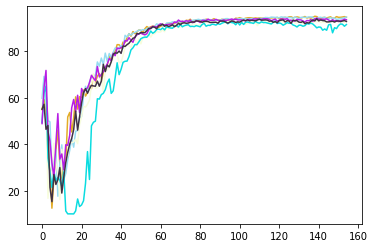

ROUND 154
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.239760
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.325071
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.929742
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.681255
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.480022

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.196459
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.345699
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.385901
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.775308
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.214016

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

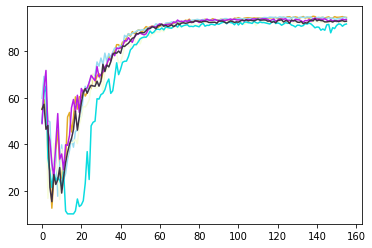

ROUND 155
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.234524
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.478060
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.459417
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.469400
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.427020

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.281082
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.202399
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.311784
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.552627
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.841286

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

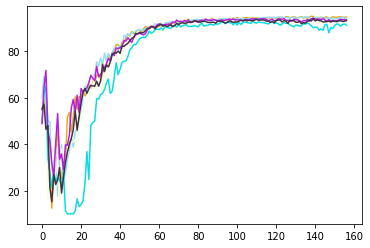

ROUND 156
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.957240
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.512148
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.509977
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.540020
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.551152

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.903853
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.429370
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.949044
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.684702
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.697129

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

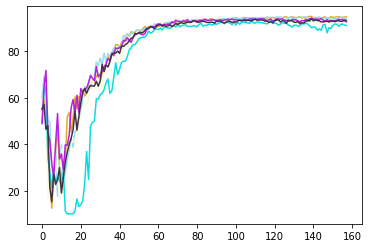

ROUND 157
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.192441
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.333717
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.577572
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.094702
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.584244

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.383798
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.364329
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.615427
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.661192
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.539777

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

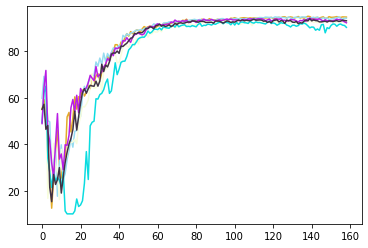

ROUND 158
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.023360
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.603604
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.489297
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.628402
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.565101

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.845804
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.301713
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.662597
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.744161
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.615120

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

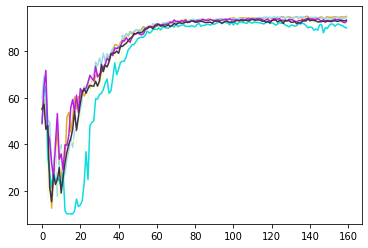

ROUND 159
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.779015
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.249350
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.503419
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.998824
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.806853

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Poor Channel, client not taken for averaging in this round

Power Allocated= 8.72166746824089
CSI= 0.2534095282096639
SNR= 23.96246557447082
Client: client37
Model clie

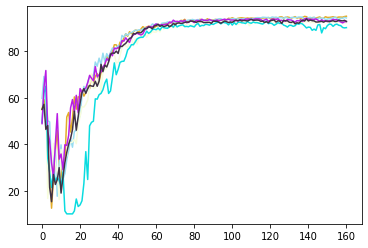

ROUND 160
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.001037
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.384224
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.191976
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.202908
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.640534

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.016446
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.224134
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.472670
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.319413
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.623356

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

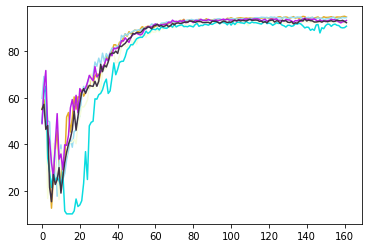

ROUND 161
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.888396
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.329862
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.500787
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.048242
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.748879

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.925403
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.291184
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.006671
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.729942
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.052552

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

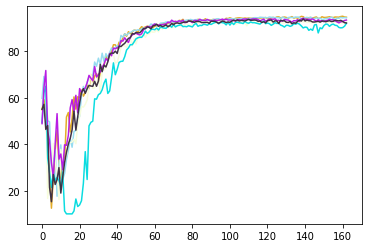

ROUND 162
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.917484
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.350191
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.322405
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.602649
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.518665

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.914422
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.284692
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.533626
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.458482
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.961075

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

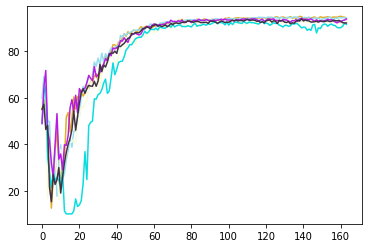

ROUND 163
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.909856
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.426870
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.442860
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.008194
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.753568

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.857684
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.540096
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.553420
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.752649
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.500621

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

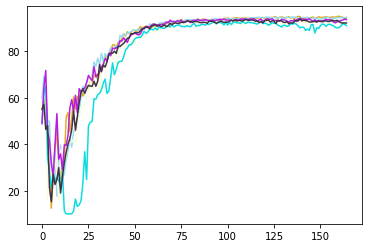

ROUND 164
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.938756
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.337084
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.670354
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.664472
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.679943

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Model client32 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.872953
Model client32 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.835729
Model client32 Train Epoch: 3 [0/1216 (0%)]	Loss: 

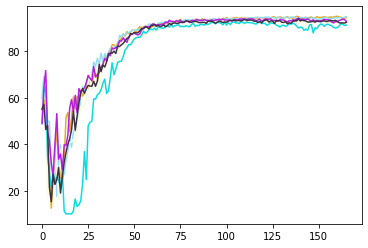

ROUND 165
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.984509
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.514452
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.293368
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.332372
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.464693

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Poor Channel, client not taken for averaging in this round

Power Allocated= 8.72166746824089
CSI= 0.2534095282096639
SNR= 23.96246557447082
Client: client37
Model clie

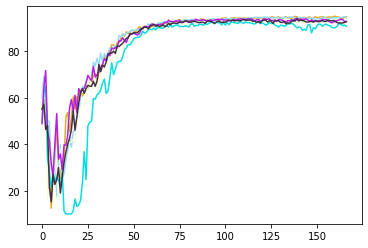

ROUND 166
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.975024
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.278639
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.432887
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.613769
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.788706

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.857893
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.522654
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.614595
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.549017
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.518051

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

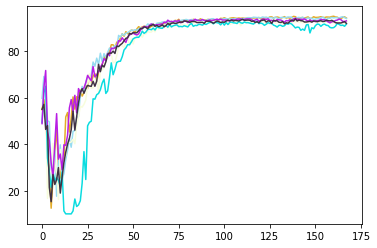

ROUND 167
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.909958
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.293668
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.946444
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.885984
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.145870

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.844269
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.440490
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.762604
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.439048
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.449990

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

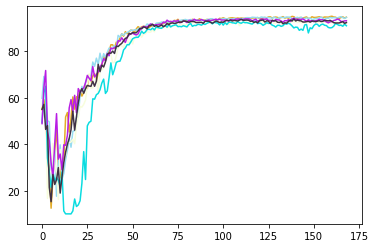

ROUND 168
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.734337
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.426865
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.848805
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.391413
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.363562

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.840228
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.603347
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.315054
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.847626
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.926014

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

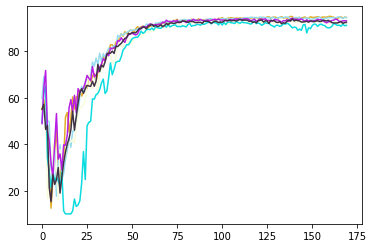

ROUND 169
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.835857
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.427097
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.608058
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.592257
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.289172

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.954684
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.469187
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.002315
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.256180
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.155234

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

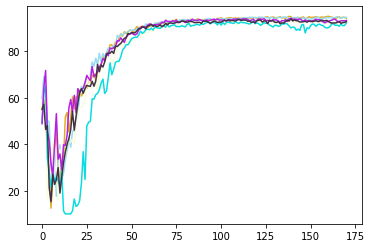

ROUND 170
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.816605
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.430675
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.214472
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.244476
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.574853

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Model client32 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.869401
Model client32 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.582380
Model client32 Train Epoch: 3 [0/1216 (0%)]	Loss: 

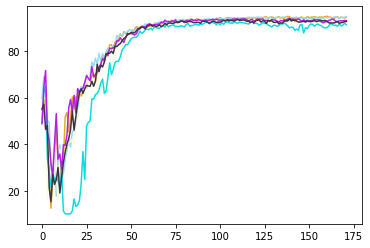

ROUND 171
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.142314
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.657470
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.660331
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.725333
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.730444

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.908058
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.407433
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.120507
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.249888
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.885279

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

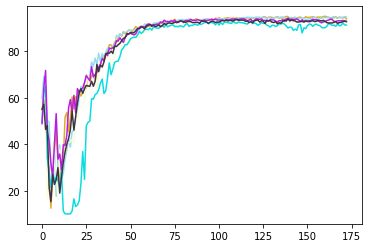

ROUND 172
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.879497
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.595690
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.636312
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.759585
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.086310

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.919203
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.442986
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.821678
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.713539
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.642964

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

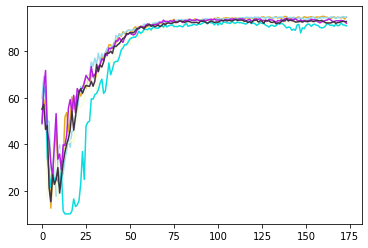

ROUND 173
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.907019
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.385912
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.728978
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.741574
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.931038

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.846693
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.632533
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.907117
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.913372
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.261975

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

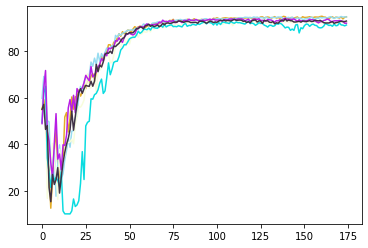

ROUND 174
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.869859
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.563618
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.566145
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.824725
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.079146

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Model client32 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.972359
Model client32 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.491132
Model client32 Train Epoch: 3 [0/1216 (0%)]	Loss: 

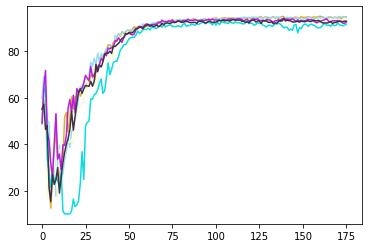

ROUND 175
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.880743
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.562076
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.760236
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.755570
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.829633

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.958621
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.371157
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.777532
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.578227
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.838039

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

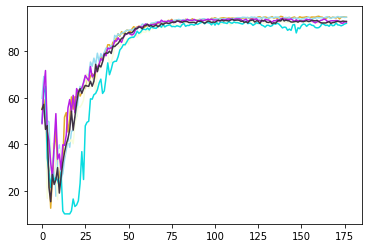

ROUND 176
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.166899
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.469648
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.540839
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.060706
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.652695

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.084837
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.419595
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.952090
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.093369
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.694641

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

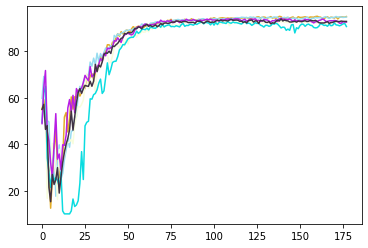

ROUND 177
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.840927
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.623535
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.392804
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.771217
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.846260

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Model client32 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.721897
Model client32 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.172122
Model client32 Train Epoch: 3 [0/1216 (0%)]	Loss: 

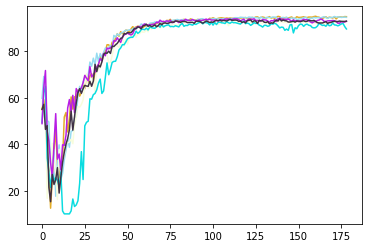

ROUND 178
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.984071
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.343641
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.462572
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.931504
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.483131

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.144030
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.591471
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.644224
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.488897
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.115058

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

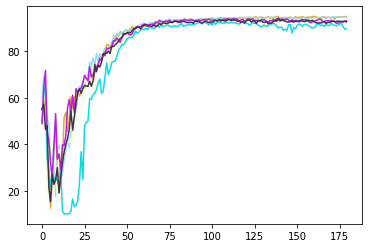

ROUND 179
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.826431
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.376633
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.388362
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.391898
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.505869

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.704605
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.371156
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.459483
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.306489
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.992819

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

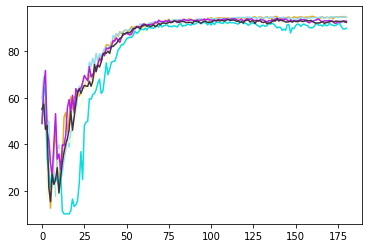

ROUND 180
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.880857
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.533799
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.789991
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.031380
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.324039

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.871678
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.313659
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.699704
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.732500
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.353639

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

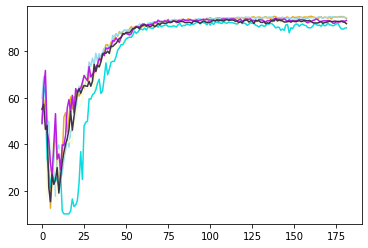

ROUND 181
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.881958
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.455107
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.515801
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.592738
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.610651

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.682288
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.312342
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.455334
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.920573
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.741670

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

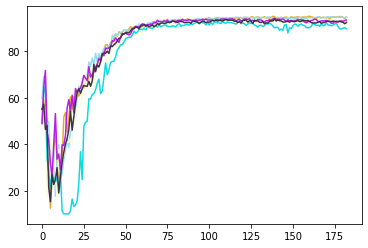

ROUND 182
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.769754
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.514833
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.550004
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.922236
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.238255

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.780077
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.385948
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.462000
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.405921
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.685162

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

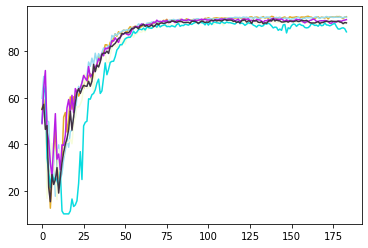

ROUND 183
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.784213
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.584220
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.361471
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.382810
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.732242

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.829163
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.521676
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.654991
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.069916
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.857740

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

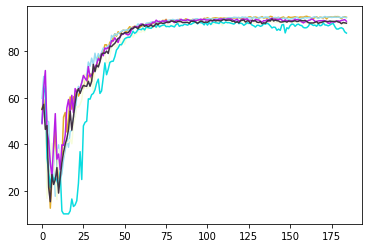

ROUND 184
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.718096
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.283635
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.495059
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.903115
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.932244

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.741236
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.334712
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.478177
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.486702
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.738122

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

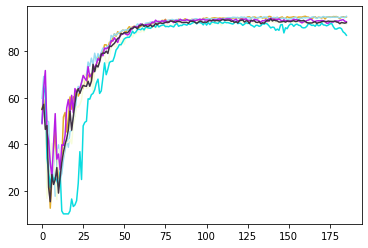

ROUND 185
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.829626
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.267857
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.546627
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.314544
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.690490

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.942008
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.263027
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.371185
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.588735
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.851071

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

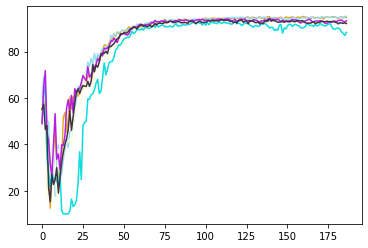

ROUND 186
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.876296
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.565532
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.472292
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.796576
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.781040

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.744841
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.260421
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.447084
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.461215
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.604068

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

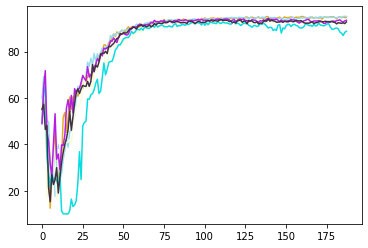

ROUND 187
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.193378
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.337719
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.643866
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.616818
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.938762

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.201472
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.379157
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.331812
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.059989
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.439371

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

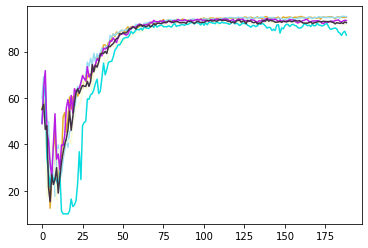

ROUND 188
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.862372
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.617360
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.592985
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.397437
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.229152

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.842220
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.396086
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.333271
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.176340
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.227516

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

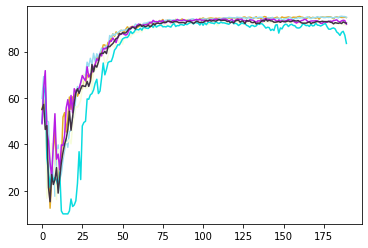

ROUND 189
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.866690
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.293419
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.750719
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.552801
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.520502

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Model client32 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.754270
Model client32 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.261916
Model client32 Train Epoch: 3 [0/1216 (0%)]	Loss: 

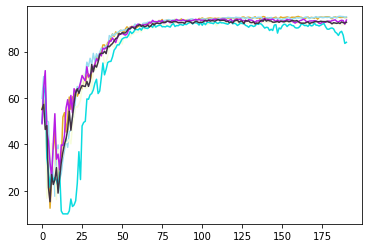

ROUND 190
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.738205
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.329625
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.509134
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.673402
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.650228

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.935272
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.373845
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.329265
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.139575
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.399258

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

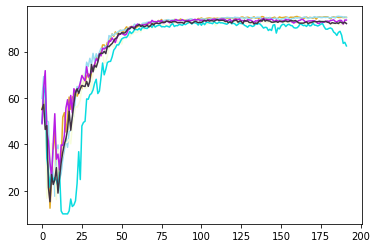

ROUND 191
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.041709
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.341242
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.453222
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.361671
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.567120

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.064342
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.362570
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.498934
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.738796
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.654173

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

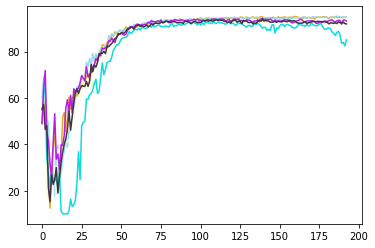

ROUND 192
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.254332
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.380838
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.577534
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.626750
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.383740

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.966272
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.355227
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.553089
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.143016
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.445718

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

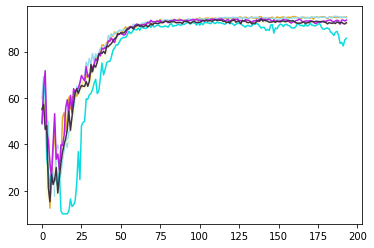

ROUND 193
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.024981
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.334457
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.318949
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.748495
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 3.094368

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.088608
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.365033
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.380119
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.888350
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.320623

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

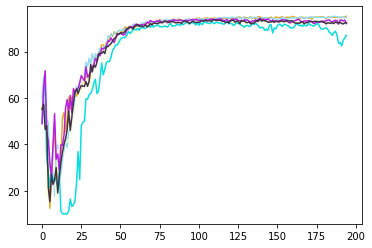

ROUND 194
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.865620
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.476830
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.596675
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.481685
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.248879

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.569660
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.423076
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.912280
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.702889
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.479382

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

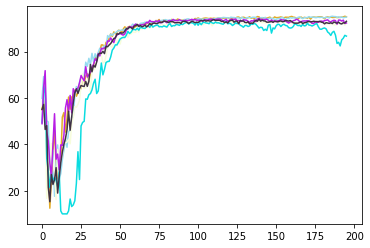

ROUND 195
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.046210
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.410772
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.608992
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.905937
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.982476

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.144211
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.358257
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.660916
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.802495
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.939543

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

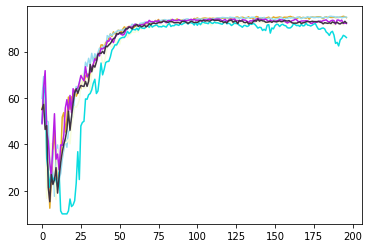

ROUND 196
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.843127
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.465865
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.080249
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.640091
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.410299

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.719371
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.447556
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.554699
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.448688
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.668152

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

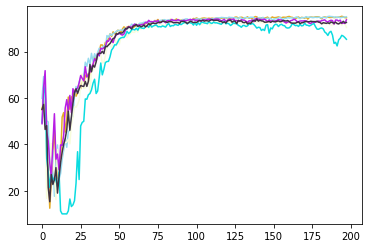

ROUND 197
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.810695
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.232458
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.434999
Model client16 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.429481
Model client16 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.893956

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.677314
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.174126
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.087899
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.918493
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.506765

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.2866808724642

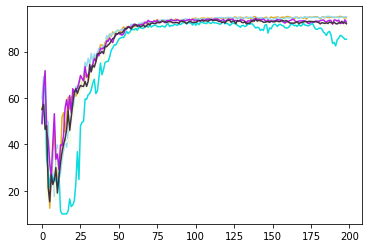

ROUND 198
0.07894000000000383
Power Allocated= 10.838645962132867
CSI= 0.5466861686288612
SNR= 23.49752893973884
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.601197658046592
CSI= 0.9375134698483643
SNR= 31.59331852258689
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.765841
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.491976
Model client30 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.475590
Model client30 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.782903
Model client30 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.627358

Power Allocated= 0
CSI= 0.015755033045748656
SNR= 27.95767476963293
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 11.286680872464245
CSI= 0.7240248168301779
SNR= 23.981905913490035
Client: client32
Model client32 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.957019
Model client32 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.365651
Model client32 Train Epoch: 3 [0/1216 (0%)]	Loss: 

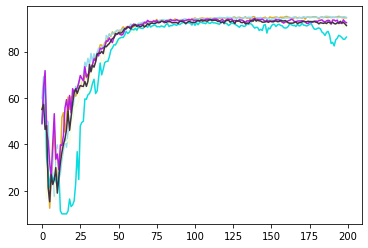

ROUND 199


In [14]:
for client in clients: #give the model and optimizer to every client
    torch.manual_seed(args.torch_seed)
    client['model'] = Net().to(device)
    #client['model'] = torch.quantization.quantize_dynamic(
    #client['model'],  # the original model
    #{torch.nn.Linear},  # a set of layers to dynamically quantize
    #dtype=torch.fp)  # the target dtype for quantized weights
    client['optim'] = optim.SGD(client['model'].parameters(), lr=args.lr)

final_acc=[]
final_loss=[]
clor = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)]) for i in range(args.numclusters)]   
for fed_round in range(args.rounds):
    overall=Net()
    if(fed_round==0): #fed_round==0
        arranged_clusters,head_snr_list=cluster_former(args.numclusters,args.clients)
        temp=deepcopy(arranged_clusters)
        temp2=deepcopy(head_snr_list)
    else:
        #print(temp)
        arranged_clusters=deepcopy(temp)
        head_snr_list=deepcopy(temp2)
#     print(arranged_clusters)
    
    no=1
    heads_list=[]
    weights=[]
    weight_head_list=[]
    head_acc=[]
    head_loss=[]
    for cluster in arranged_clusters:
        
        head=cluster['Cluster Head']
        members=cluster['Members']
        snrs=cluster['SNR']
        csis=cluster['CSI']
        weights.append(sum(snrs))
        weight_head_list.append([head,sum(snrs)])
        new_members=[]
        
        for ij in members:
        #print(ij)
            cl_no=int(ij[6:])
            new_members.append(clients[cl_no-1])
#         print(head)
        head=clients[int(head[6:])-1]
        cluster['Members']=new_members
#         print(head)

        smallmu1=0
        gsmall1=3.402823466E+38 
        
        #water filling algorithm
        mu=1e-15
        while(mu<=1):
            g1=0
            pn1=0
            for jj in csis:
                pn=max(1/mu-1/jj,0)
                g1+=math.log(1+pn*jj) #capacity of a channel (shannon's law)
                pn1+=pn
            g=g1-mu*(pn1-P*30)
            if(g<gsmall1):
                smallmu1=mu
                gsmall1=g
            mu+=0.00002
        
        print(smallmu1)
        good_mem=[]
#         print(len(snrs))
#         print(len(csis))
#         print(len(new_members))
        index=0
        for client in new_members:
            goodchannel=ClientUpdate(args, device, client,key_np,key,snrs[index],csis[index],smallmu1,head)
            index+=1
            if(goodchannel):
                good_mem.append(client)
        
        head['model']=averageModels(head['model'], good_mem)
        arr=test(args,head['model'], device, global_test_loader, 'Cluster'+str(no),fed_round)
        ac=arr[0]#test(args,head['model'], device, global_test_loader, 'Cluster'+str(no),fed_round)[0]
        no+=1
        heads_list.append(head)
        head_acc.append(ac)
        head_loss.append(arr[1])#test(args,head['model'], device, global_test_loader, 'Cluster'+str(no),fed_round)[1])
    
    final_acc.append(head_acc)
    final_loss.append(head_loss)
    fig,ax=plt.subplots()
    
    #ax.plot([i for i in range(fed_round)],head_acc[0])
    for jj in range(0,args.numclusters):
        
        ax.plot([i for i in range(len(final_acc))],[final_acc[j][jj] for j in range(len(final_acc))], color = clor[jj])
        
    #ax.plot([i for i in range(len(final_acc))],[final_acc[j][0] for j in range(len(final_acc))], color ="red")
    #ax.plot([i for i in range(len(final_acc))],[final_acc[j][1] for j in range(len(final_acc))],color ="blue")
    #ax.plot([i for i in range(len(final_acc))],[final_acc[j][2] for j in range(len(final_acc))],color ="green")
    #ax.plot([i for i in range(len(final_acc))],[final_acc[j][3] for j in range(len(final_acc))],color ="black")
    #ax.plot([i for i in range(len(final_acc))],head_acc[1], fed_round, color ="blue")
    #ax.plot([i for i in range(len(final_acc))],head_acc[2], fed_round, color ="green")
    #ax.plot([i for i in range(len(final_acc))],head_acc[3], fed_round, color ="black")
    
    
    plt.show()
    weightsum=sum(weights)
    
    weights[:] = [x / weightsum for x in weights]
    for aah in range(len(weight_head_list)):
        weight_head_list[aah][1]=weights[aah]
    final_heads,nets=decentralized(heads_list,head_snr_list,weight_head_list)
    
    for head in range(len(final_heads)):
        for cluster in arranged_clusters:
            head1=cluster['Cluster Head']
            if(head1==final_heads[head]['hook'].id):
                for mem in cluster['Members']:
                    mem['model'].load_state_dict(nets[head].state_dict())
    print("ROUND",fed_round)

In [15]:
print(final_acc)

[[54.92, 59.82, 56.8, 49.36, 48.91, 55.1], [59.27, 69.21, 62.44, 62.1, 64.42, 57.21], [53.92, 62.42, 64.66, 64.91, 71.76, 46.44], [35.31, 50.2, 16.77, 34.08, 45.59, 48.1], [28.35, 49.65, 28.08, 28.07, 41.44, 21.47], [12.53, 28.89, 26.29, 21.45, 32.09, 15.32], [25.43, 32.85, 40.39, 28.44, 25.85, 27.02], [37.42, 37.65, 32.17, 24.31, 40.24, 22.74], [46.09, 17.68, 27.37, 25.73, 53.21, 24.78], [31.35, 31.68, 16.25, 24.47, 33.63, 29.99], [25.48, 39.78, 37.86, 21.85, 35.85, 19.03], [32.76, 24.97, 31.85, 28.09, 29.04, 25.9], [32.75, 27.43, 32.83, 11.35, 39.81, 32.18], [51.76, 33.43, 35.25, 10.09, 39.57, 36.57], [53.7, 37.4, 41.42, 10.1, 43.91, 40.07], [45.3, 42.55, 40.65, 10.09, 55.68, 42.53], [51.27, 38.76, 41.03, 10.07, 59.27, 46.3], [60.4, 45.62, 42.18, 11.35, 53.97, 54.28], [55.12, 45.89, 40.28, 16.49, 61.09, 46.1], [60.48, 51.39, 48.48, 13.25, 53.59, 51.82], [60.17, 52.01, 51.9, 13.94, 63.99, 57.75], [63.38, 61.09, 56.28, 15.74, 62.25, 62.25], [60.75, 64.93, 56.01, 23.24, 63.63, 63.95], [